In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from tqdm import tqdm

In [2]:
train_data = pd.read_csv('C:/Users/pc/Documents/Projects/archive/train_dataset.csv')

In [3]:
train_data_salaries = pd.read_csv('C:/Users/pc/Documents/Projects/archive/train_salaries.csv')

In [4]:
test_data = pd.read_csv('C:/Users/pc/Documents/Projects/archive/test_dataset.csv')

In [5]:
train_data.head()

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis
0,JOB1362684407687,COMP37,CFO,MASTERS,MATH,HEALTH,10,83
1,JOB1362684407688,COMP19,CEO,HIGH_SCHOOL,NONE,WEB,3,73
2,JOB1362684407689,COMP52,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38
3,JOB1362684407690,COMP38,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17
4,JOB1362684407691,COMP7,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16


In [6]:
train_data_salaries.head()

,jobId,salary
0,JOB1362684407687,130
1,JOB1362684407688,101
2,JOB1362684407689,137
3,JOB1362684407690,142
4,JOB1362684407691,163


In [7]:
test_data.head()

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis
0,JOB1362685407687,COMP33,MANAGER,HIGH_SCHOOL,NONE,HEALTH,22,73
1,JOB1362685407688,COMP13,JUNIOR,NONE,NONE,AUTO,20,47
2,JOB1362685407689,COMP10,CTO,MASTERS,BIOLOGY,HEALTH,17,9
3,JOB1362685407690,COMP21,MANAGER,HIGH_SCHOOL,NONE,OIL,14,96
4,JOB1362685407691,COMP36,JUNIOR,DOCTORAL,BIOLOGY,OIL,10,44


In [8]:
train_data['salary'] = train_data_salaries['salary']

In [9]:
train_data.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis', 'salary'],
      dtype='object')

In [10]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 9 columns):
 #   Column               Non-Null Count    Dtype 
---  ------               --------------    ----- 
 0   jobId                1000000 non-null  object
 1   companyId            1000000 non-null  object
 2   jobType              1000000 non-null  object
 3   degree               1000000 non-null  object
 4   major                1000000 non-null  object
 5   industry             1000000 non-null  object
 6   yearsExperience      1000000 non-null  int64 
 7   milesFromMetropolis  1000000 non-null  int64 
 8   salary               1000000 non-null  int64 
dtypes: int64(3), object(6)
memory usage: 68.7+ MB


In [11]:
train_data.describe()

,yearsExperience,milesFromMetropolis,salary
count,1000000.000000,1000000.000000,1000000.000000
mean,11.992386,49.529260,116.061818
std,7.212391,28.877733,38.717936
min,0.000000,0.000000,0.000000
25%,6.000000,25.000000,88.000000
50%,12.000000,50.000000,114.000000
75%,18.000000,75.000000,141.000000
max,24.000000,99.000000,301.000000


In [12]:
test_data.describe()

,yearsExperience,milesFromMetropolis
count,1000000.000000,1000000.000000
mean,12.002104,49.526414
std,7.213179,28.889713
min,0.000000,0.000000
25%,6.000000,25.000000
50%,12.000000,50.000000
75%,18.000000,75.000000
max,24.000000,99.000000


In [13]:
print(len(train_data))
len(test_data)

1000000


1000000

In [14]:
train_data.nunique()

jobId                  1000000
companyId                   63
jobType                      8
degree                       5
major                        9
industry                     7
yearsExperience             25
milesFromMetropolis        100
salary                     280
dtype: int64

In [15]:
test_data.nunique()

jobId                  1000000
companyId                   63
jobType                      8
degree                       5
major                        9
industry                     7
yearsExperience             25
milesFromMetropolis        100
dtype: int64

In [16]:
train_data.isnull().sum()

jobId                  0
companyId              0
jobType                0
degree                 0
major                  0
industry               0
yearsExperience        0
milesFromMetropolis    0
salary                 0
dtype: int64

In [17]:
test_data.isnull().sum()

jobId                  0
companyId              0
jobType                0
degree                 0
major                  0
industry               0
yearsExperience        0
milesFromMetropolis    0
dtype: int64

In [18]:
train_data.drop(labels = ['jobId', 'companyId'], axis = 1)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,CFO,MASTERS,MATH,HEALTH,10,83,130
1,CEO,HIGH_SCHOOL,NONE,WEB,3,73,101
2,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38,137
3,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17,142
4,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16,163
...,...,...,...,...,...,...,...
999995,VICE_PRESIDENT,BACHELORS,CHEMISTRY,HEALTH,19,94,88
999996,CTO,HIGH_SCHOOL,NONE,FINANCE,12,35,160
999997,JUNIOR,HIGH_SCHOOL,NONE,EDUCATION,16,81,64
999998,CFO,MASTERS,NONE,HEALTH,6,5,149


In [19]:
train_data['jobType'].value_counts()

SENIOR            125886
VICE_PRESIDENT    125235
MANAGER           125121
CTO               125046
JANITOR           124971
CEO               124778
JUNIOR            124594
CFO               124369
Name: jobType, dtype: int64

In [20]:
train_data['degree'].value_counts()

HIGH_SCHOOL    236976
NONE           236854
BACHELORS      175495
DOCTORAL       175364
MASTERS        175311
Name: degree, dtype: int64

In [21]:
test_data.drop(labels = ['jobId', 'companyId'], axis = 1)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis
0,MANAGER,HIGH_SCHOOL,NONE,HEALTH,22,73
1,JUNIOR,NONE,NONE,AUTO,20,47
2,CTO,MASTERS,BIOLOGY,HEALTH,17,9
3,MANAGER,HIGH_SCHOOL,NONE,OIL,14,96
4,JUNIOR,DOCTORAL,BIOLOGY,OIL,10,44
...,...,...,...,...,...,...
999995,VICE_PRESIDENT,BACHELORS,MATH,OIL,14,3
999996,MANAGER,NONE,NONE,HEALTH,20,67
999997,JANITOR,NONE,NONE,OIL,1,91
999998,CTO,DOCTORAL,MATH,OIL,14,63


In [22]:
corr = train_data.corr()

In [23]:
corr

,yearsExperience,milesFromMetropolis,salary
yearsExperience,1.000000,0.000673,0.375013
milesFromMetropolis,0.000673,1.000000,-0.297666
salary,0.375013,-0.297666,1.000000


<AxesSubplot:>

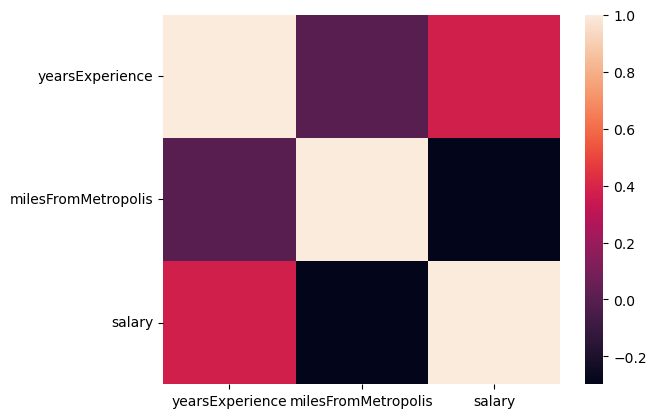

In [24]:
sns.heatmap(corr)

# CHI-SQUARE TEST

In [25]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [26]:
def perform_chi_square_test(var_1, var_2):
    dataset_table = pd.crosstab(var_1, var_2)
    observed_values = dataset_table.values
    contingency_table = stats.chi2_contingency(dataset_table)
    expected_values = contingency_table[3]
    no_of_rows = len(dataset_table)
    no_of_columns = len(dataset_table.columns)
    degree_f = (no_of_rows - 1)*(no_of_columns - 1)
    print(degree_f)
    alpha = 0.05
    print('Significance level: ',alpha)
    chi_square = sum([(o-e)**2./e for o,e in zip(observed_values, expected_values)])
    chi_square_statistic = chi_square[0] + chi_square[1]
    print(chi_square_statistic)
    critical_value = chi2.ppf(q = 1-alpha, df = degree_f)
    print(critical_value)
    p_value = 1 - chi2.cdf(x = chi_square_statistic, df = degree_f)
    print(p_value)
    if chi_square_statistic>=critical_value:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")

    if p_value<=alpha:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")

In [27]:
categorical_list = ['jobType', 'degree', 'major', 'industry']
for x in categorical_list:
    for i in categorical_list:
        if i!= x:
            print(' chi-square test on: ',x,' ',i,'\n' )
            perform_chi_square_test(train_data[x],train_data[i])
            print('--------------------------------------------\n')
            

 chi-square test on:  jobType   degree 

28
Significance level:  0.05
50117.72406771936
41.33713815142739
0.0
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables
--------------------------------------------

 chi-square test on:  jobType   major 

56
Significance level:  0.05
16703.025256041707
74.46832415930936
0.0
Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables
--------------------------------------------

 chi-square test on:  jobType   industry 

42
Significance level:  0.05
14.913329934821567
58.12403768086803
0.9999643570205455
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
--------------------------------------------

 chi-square test on:  degree   jobType 

28
Significance level:  0.05
5701.676800515897
41.33713815142739
0.0
Reject

In [28]:
train_data.head(10)

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,JOB1362684407687,COMP37,CFO,MASTERS,MATH,HEALTH,10,83,130
1,JOB1362684407688,COMP19,CEO,HIGH_SCHOOL,NONE,WEB,3,73,101
2,JOB1362684407689,COMP52,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38,137
3,JOB1362684407690,COMP38,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17,142
4,JOB1362684407691,COMP7,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16,163
5,JOB1362684407692,COMP15,MANAGER,DOCTORAL,COMPSCI,FINANCE,2,31,113
6,JOB1362684407693,COMP15,CFO,NONE,NONE,HEALTH,23,24,178
7,JOB1362684407694,COMP24,JUNIOR,BACHELORS,CHEMISTRY,EDUCATION,9,70,73
8,JOB1362684407695,COMP20,JANITOR,HIGH_SCHOOL,NONE,EDUCATION,1,54,31
9,JOB1362684407696,COMP41,VICE_PRESIDENT,BACHELORS,CHEMISTRY,AUTO,17,68,104


In [29]:
train_data['yearsExperience'].head(3)

0    10
1     3
2    10
Name: yearsExperience, dtype: int64

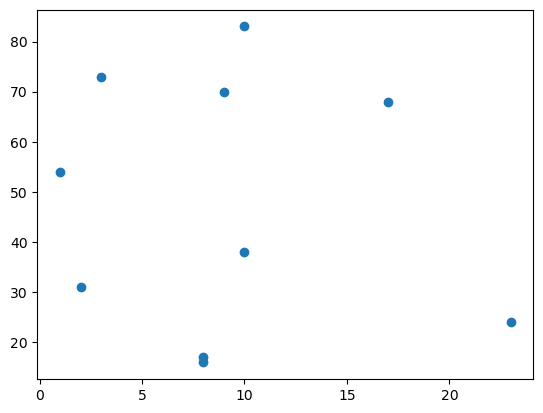

In [30]:
plt.scatter(train_data['yearsExperience'].head(10), train_data['milesFromMetropolis'].head(10))

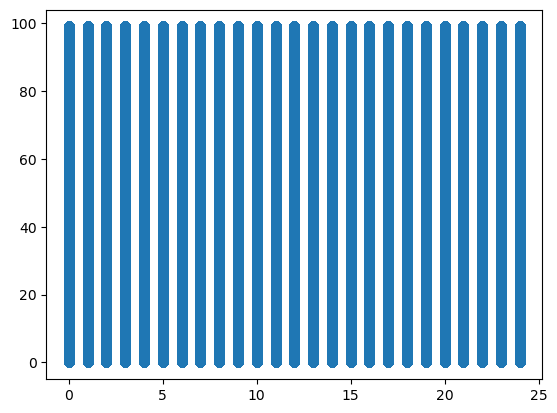

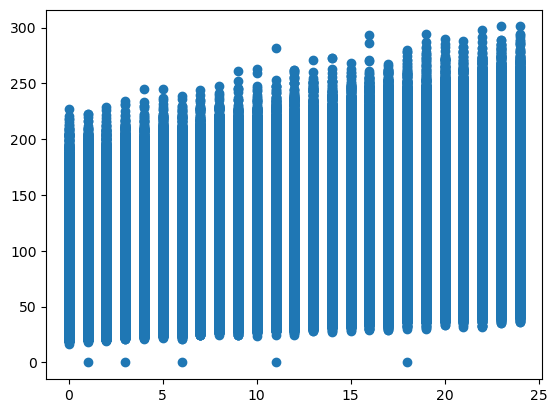

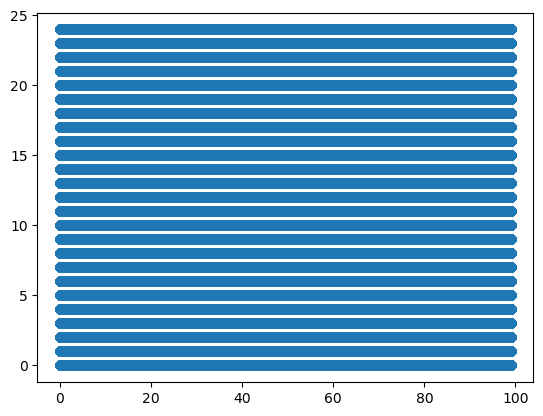

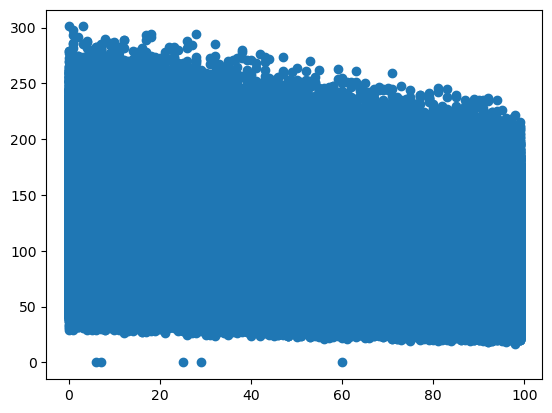

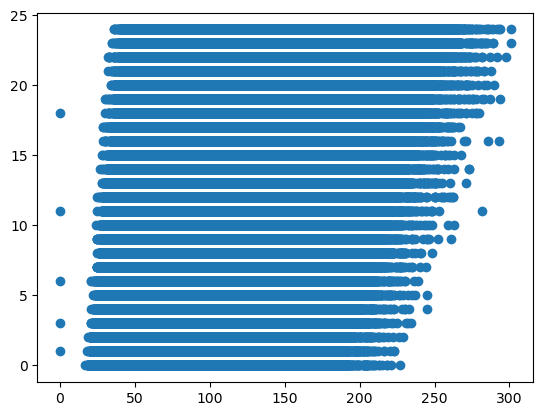

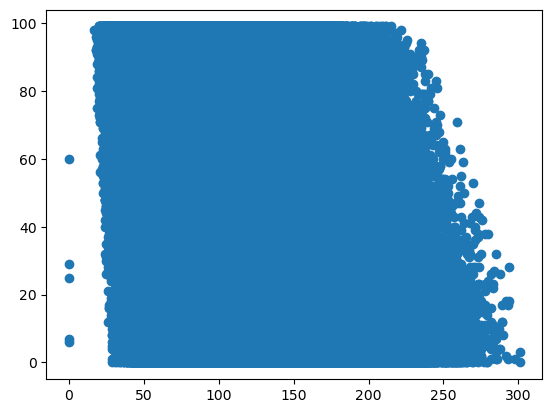

In [31]:
#def plot_scatter(x, y):
    #plt.scatter(train_data[x], train_data[y])
    #plt.show()
loop = ['yearsExperience', 'milesFromMetropolis', 'salary']
for x in loop:
    for i in loop:
        if i!=x:
            plt.scatter(train_data[x], train_data[i])
            plt.show()

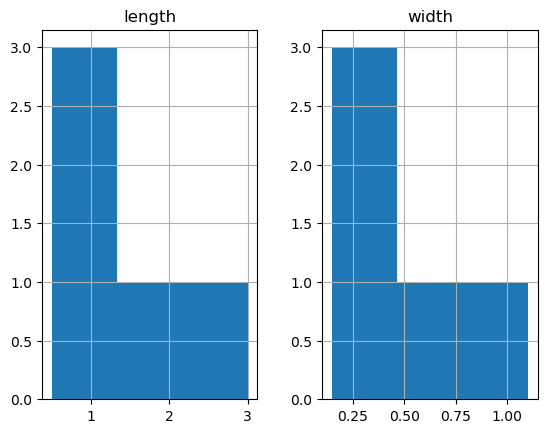

In [32]:
df = pd.DataFrame({
    'length': [1.5, 0.5, 1.2, 0.9, 3],
    'width': [0.7, 0.2, 0.15, 0.2, 1.1]
    }, index=['pig', 'rabbit', 'duck', 'chicken', 'horse'])
hist = df.hist(bins=3)

In [33]:
train_data.head(5)

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,JOB1362684407687,COMP37,CFO,MASTERS,MATH,HEALTH,10,83,130
1,JOB1362684407688,COMP19,CEO,HIGH_SCHOOL,NONE,WEB,3,73,101
2,JOB1362684407689,COMP52,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38,137
3,JOB1362684407690,COMP38,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17,142
4,JOB1362684407691,COMP7,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16,163


array([[<AxesSubplot:title={'center':'yearsExperience'}>,
        <AxesSubplot:title={'center':'milesFromMetropolis'}>],
       [<AxesSubplot:title={'center':'salary'}>, <AxesSubplot:>]],
      dtype=object)

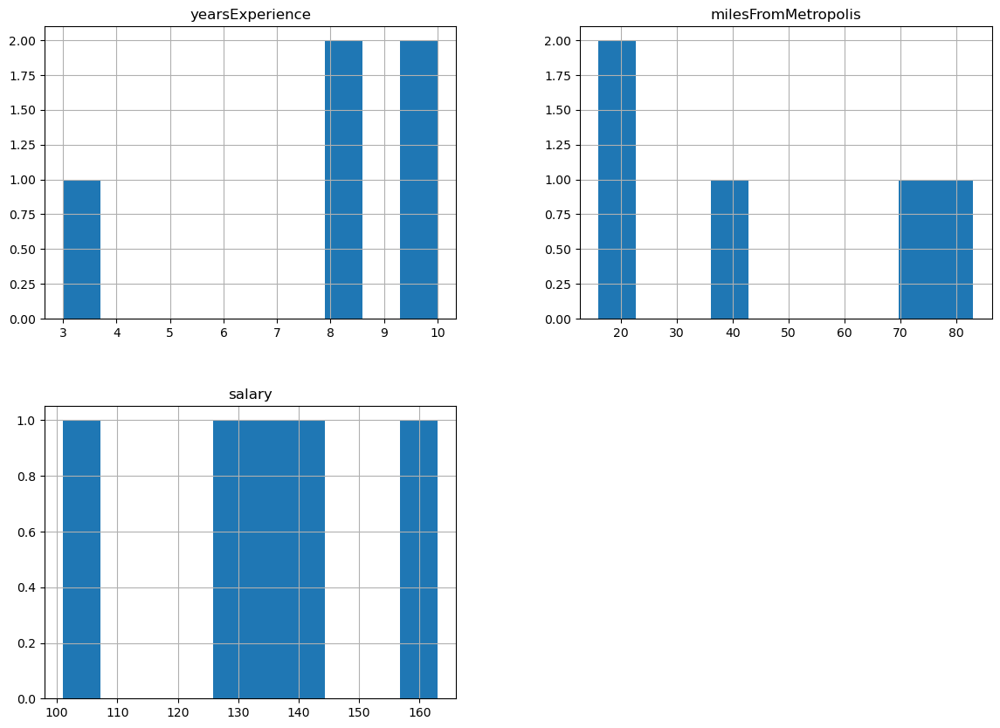

In [34]:
train_data.head(5).hist(column = ['yearsExperience', 'milesFromMetropolis', 'salary'], figsize = (14, 10))

array([[<AxesSubplot:title={'center':'yearsExperience'}>,
        <AxesSubplot:title={'center':'milesFromMetropolis'}>],
       [<AxesSubplot:title={'center':'salary'}>, <AxesSubplot:>]],
      dtype=object)

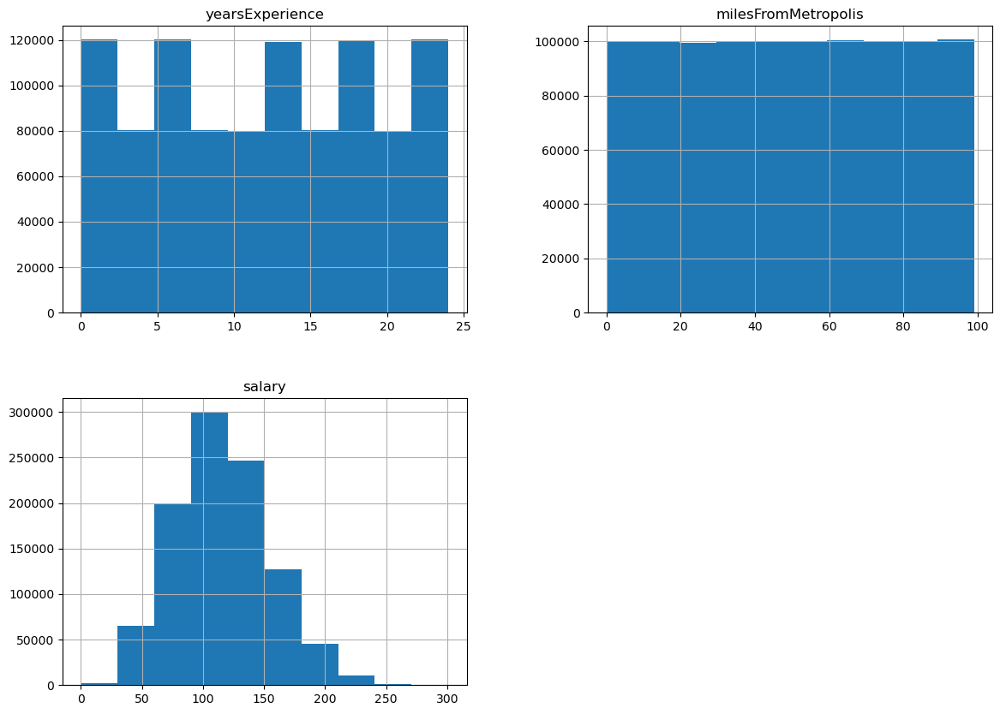

In [35]:
train_data.hist(column = ['yearsExperience', 'milesFromMetropolis', 'salary'], figsize = (14, 10))

In [36]:
l = [[1, 2, 3], [1, None, 4], [2, 1, 3], [1, 2, 2]]
df = pd.DataFrame(l, columns=["a", "b", "c"])
df

,a,b,c
0,1,2.0,3
1,1,NaN,4
2,2,1.0,3
3,1,2.0,2


In [37]:
df.groupby(by = 'b').sum()

,a,c
b,,
1.0,2,3
2.0,2,5


In [38]:
k = train_data.groupby(by = 'jobType').sum()

In [39]:
type(k)

pandas.core.frame.DataFrame

In [40]:
lpu = train_data.groupby('jobType').sum()

In [41]:
lpu

,yearsExperience,milesFromMetropolis,salary
jobType,,,
CEO,1497120,6173823,18131669
CFO,1491239,6165309,16846844
CTO,1501904,6199897,16941230
JANITOR,1495860,6179043,8849577
JUNIOR,1494167,6187334,11877740
MANAGER,1499867,6193240,14434909
SENIOR,1510207,6240491,13279434
VICE_PRESIDENT,1502022,6190123,15700415


In [42]:
train_data = train_data.drop(labels = ['jobId', 'companyId'], axis = 1)
train_data

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,CFO,MASTERS,MATH,HEALTH,10,83,130
1,CEO,HIGH_SCHOOL,NONE,WEB,3,73,101
2,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38,137
3,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17,142
4,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16,163
...,...,...,...,...,...,...,...
999995,VICE_PRESIDENT,BACHELORS,CHEMISTRY,HEALTH,19,94,88
999996,CTO,HIGH_SCHOOL,NONE,FINANCE,12,35,160
999997,JUNIOR,HIGH_SCHOOL,NONE,EDUCATION,16,81,64
999998,CFO,MASTERS,NONE,HEALTH,6,5,149


In [43]:
train_data.groupby(['jobType']).count()

,degree,major,industry,yearsExperience,milesFromMetropolis,salary
jobType,,,,,,
CEO,124778,124778,124778,124778,124778,124778
CFO,124369,124369,124369,124369,124369,124369
CTO,125046,125046,125046,125046,125046,125046
JANITOR,124971,124971,124971,124971,124971,124971
JUNIOR,124594,124594,124594,124594,124594,124594
MANAGER,125121,125121,125121,125121,125121,125121
SENIOR,125886,125886,125886,125886,125886,125886
VICE_PRESIDENT,125235,125235,125235,125235,125235,125235


In [44]:
train_data.groupby(['jobType']).count().head(5)

,degree,major,industry,yearsExperience,milesFromMetropolis,salary
jobType,,,,,,
CEO,124778,124778,124778,124778,124778,124778
CFO,124369,124369,124369,124369,124369,124369
CTO,125046,125046,125046,125046,125046,125046
JANITOR,124971,124971,124971,124971,124971,124971
JUNIOR,124594,124594,124594,124594,124594,124594


<AxesSubplot:xlabel='jobType'>

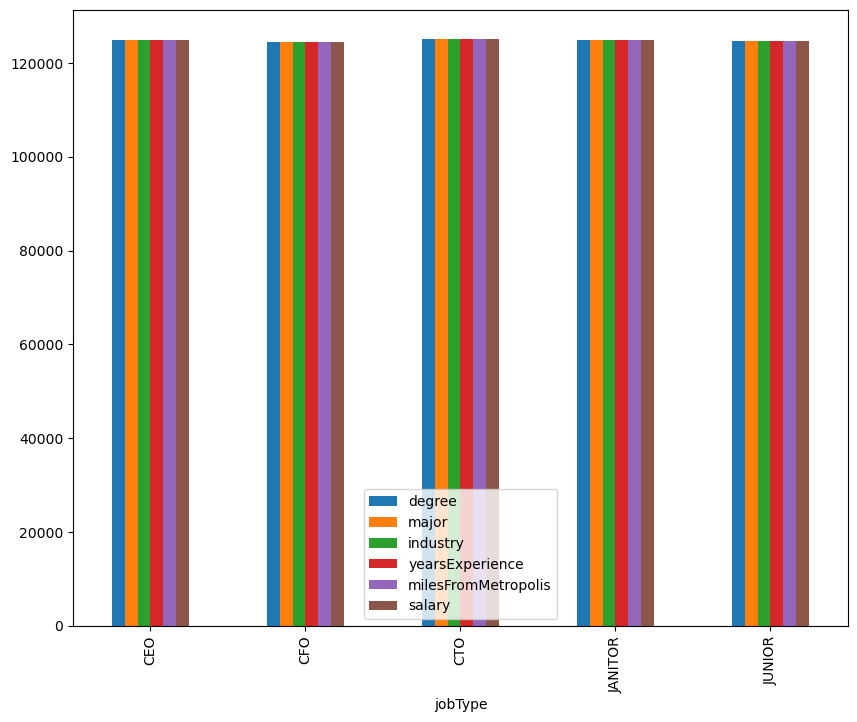

In [45]:
train_data.groupby(['jobType']).count().head(5).plot(kind = 'bar', figsize = (10, 8))

<AxesSubplot:xlabel='jobType'>

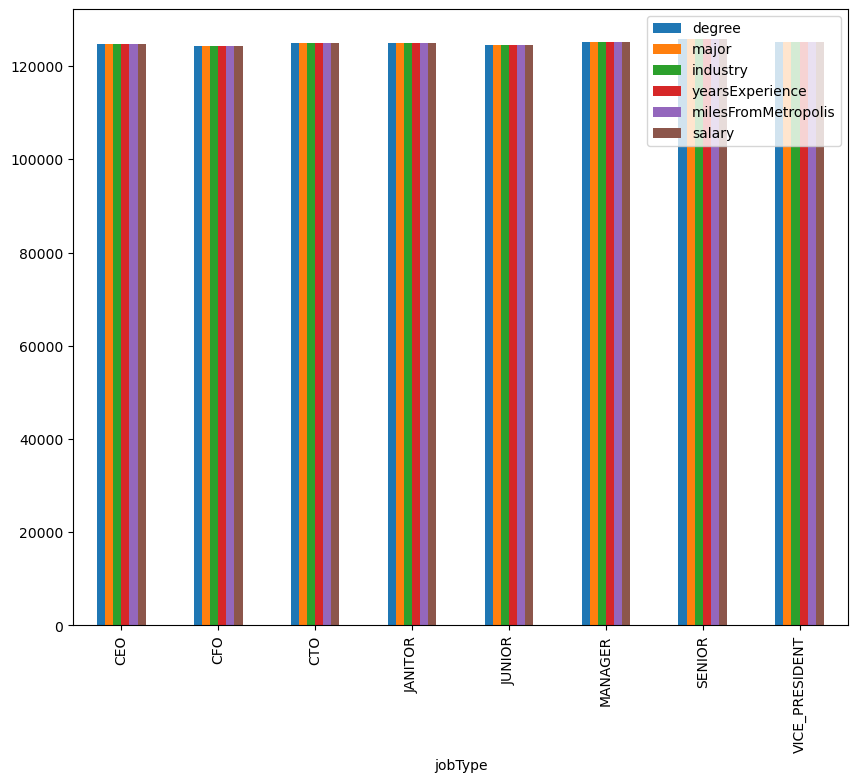

In [46]:
train_data.groupby(['jobType']).count().plot(kind = 'bar', figsize = (10, 8))

# BOX PLOT

<AxesSubplot:>

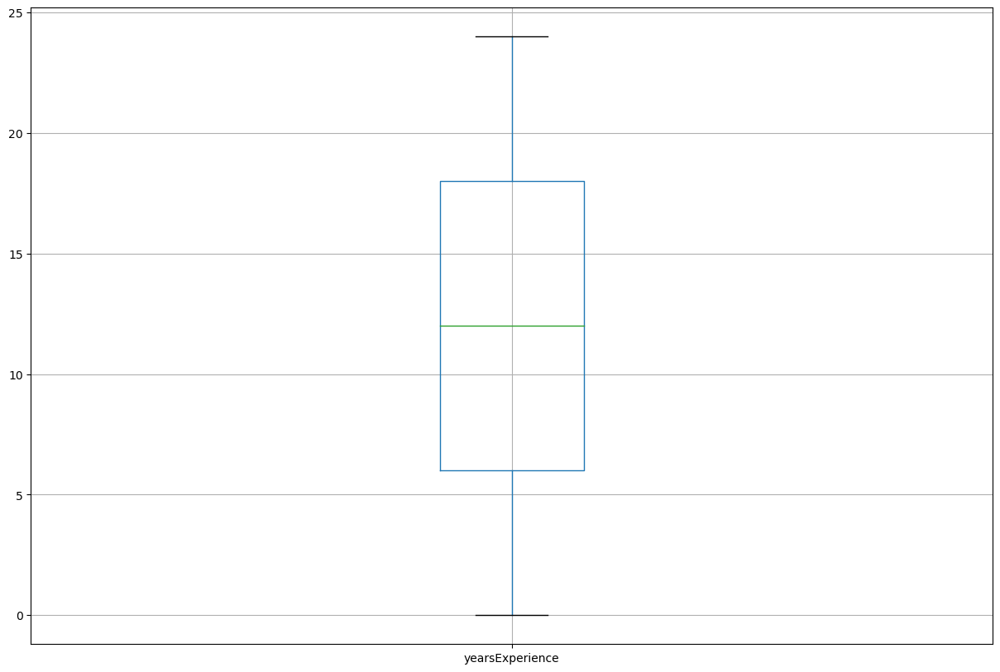

In [47]:
train_data.boxplot(column = 'yearsExperience', figsize = (15, 10))

In [48]:
q1 = train_data['yearsExperience'].quantile(q = .25)
q1

6.0

In [49]:
q3 = train_data['yearsExperience'].quantile(q = .75)
q3

18.0

In [50]:
iqr = q3-q1
LL = q1-1.5*(iqr)
UL = q3+1.5*(iqr)
print(LL, UL)

-12.0 36.0


In [51]:
train_data['yearsExperience'].quantile(q = 0)

0.0

In [52]:
train_data['yearsExperience'].quantile(q = 1)

24.0

<AxesSubplot:>

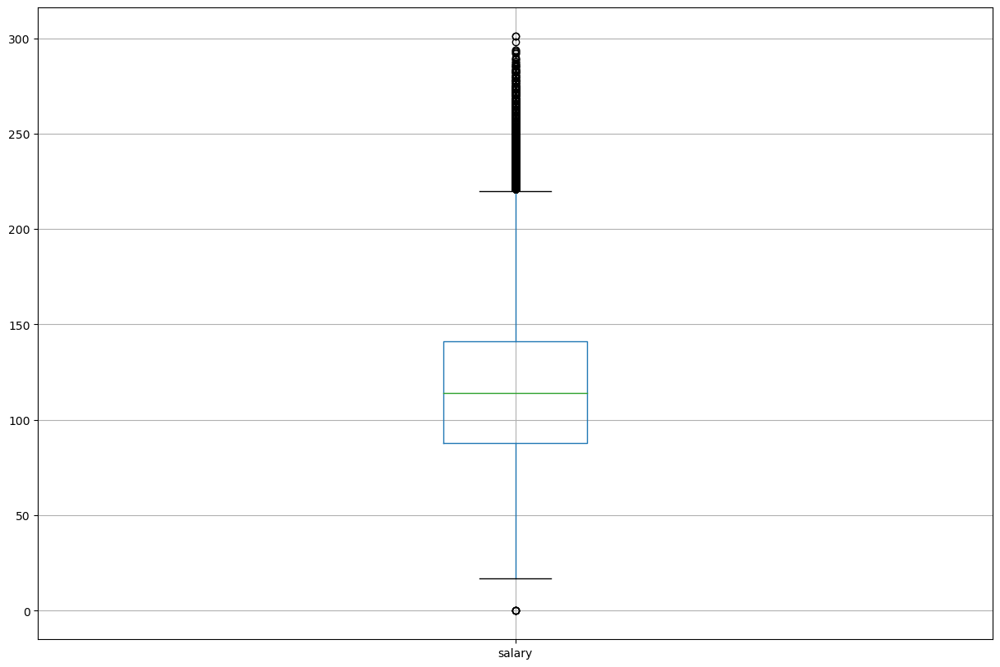

In [53]:
train_data.boxplot(column = 'salary', figsize = (15, 10))

In [54]:
q1 = train_data['salary'].quantile(q = .25)
q1

88.0

In [55]:
q3 = train_data['salary'].quantile(q = .75)
q3

141.0

In [56]:
train_data['salary'].quantile(q = 0)

0.0

In [57]:
train_data['salary'].quantile(q = 1)

301.0

In [58]:
iqr = q3-q1
LL = q1-1.5*(iqr)
UL = q3+1.5*(iqr)
print(LL, UL)

8.5 220.5


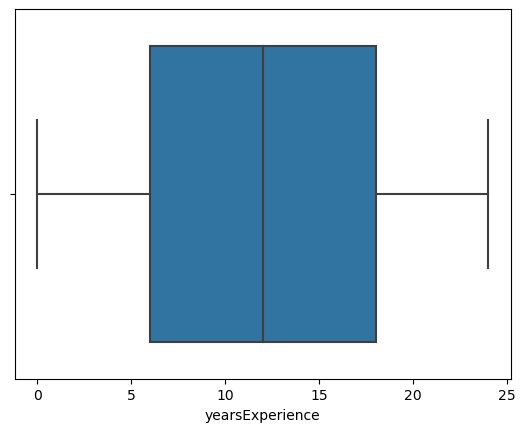

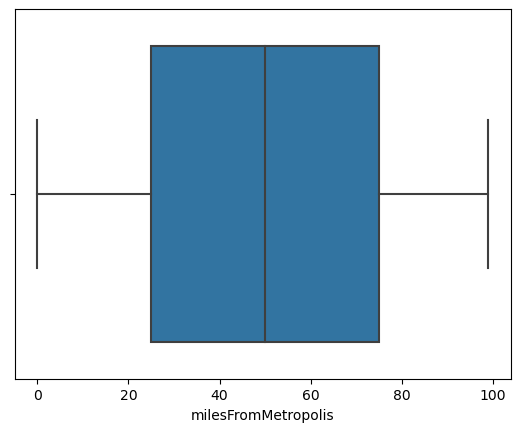

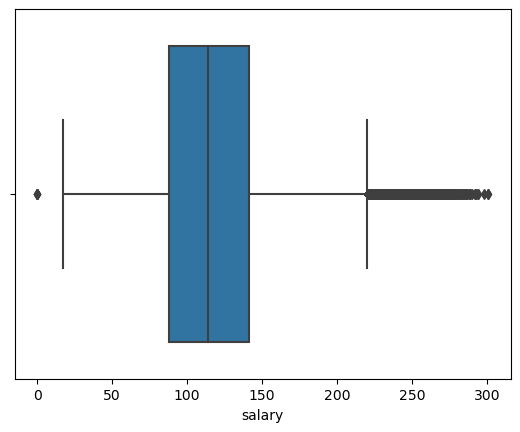

In [59]:
for i in loop:
    sns.boxplot(train_data[i])
    plt.show()

# Practice

In [60]:
df = sns.load_dataset('tips')
df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<AxesSubplot:xlabel='sex', ylabel='total_bill'>

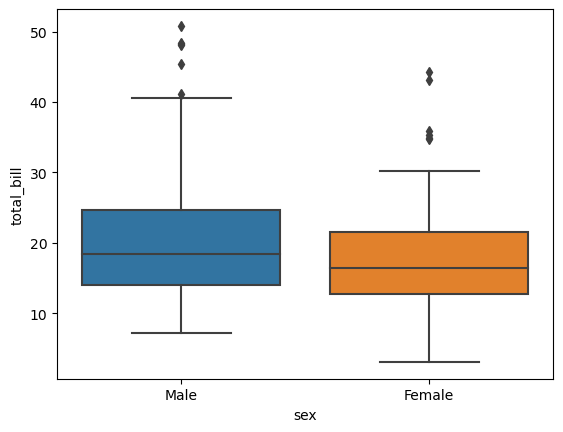

In [61]:
sns.boxplot('sex', 'total_bill', data=df)

In [62]:
df1 = df[df['sex'] == 'Male']
df2 = df[df['sex'] == 'Female']
df1.head(5)

,total_bill,tip,sex,smoker,day,time,size
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
5,25.29,4.71,Male,No,Sun,Dinner,4
6,8.77,2.00,Male,No,Sun,Dinner,2


In [63]:
df2.mean()

total_bill    18.056897
tip            2.833448
size           2.459770
dtype: float64

In [64]:
df1.mean()

total_bill    20.744076
tip            3.089618
size           2.630573
dtype: float64

In [65]:
df1.columns

Index(['total_bill', 'tip', 'sex', 'smoker', 'day', 'time', 'size'], dtype='object')

In [66]:

df1.sort_values(by = 'total_bill').head(200)

,total_bill,tip,sex,smoker,day,time,size
172,7.25,5.15,Male,Yes,Sun,Dinner,2
149,7.51,2.00,Male,No,Thur,Lunch,2
195,7.56,1.44,Male,No,Thur,Lunch,2
218,7.74,1.44,Male,Yes,Sat,Dinner,2
126,8.52,1.48,Male,No,Thur,Lunch,2
...,...,...,...,...,...,...,...
182,45.35,3.50,Male,Yes,Sun,Dinner,3
156,48.17,5.00,Male,No,Sun,Dinner,6
59,48.27,6.73,Male,No,Sat,Dinner,4
212,48.33,9.00,Male,No,Sat,Dinner,4


<AxesSubplot:xlabel='sex', ylabel='total_bill'>

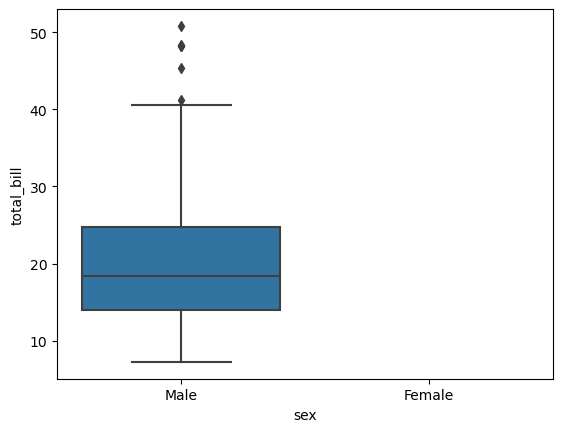

In [67]:
sns.boxplot(x = 'sex', y = 'total_bill', data = df1)

In [68]:
q1 = df1.total_bill.quantile(.25)
q3 = df1.total_bill.quantile(.75)
iqr = q3 - q1
ll = q1-1.5*iqr
ul = q3+1.5*iqr
print(q1, q3, iqr, ll, ul)

14.0 24.71 10.71 -2.0650000000000013 40.775000000000006


<AxesSubplot:xlabel='tip', ylabel='total_bill'>

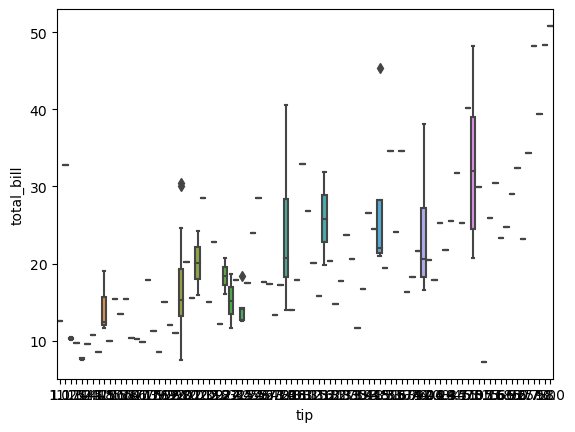

In [69]:
sns.boxplot(x = 'tip', y = 'total_bill', data = df1)

In [70]:
newdf = df[df['day'] == 'Thur']# && df['total_bill'] > 10] && df['total_bill']<20]
newdf

,total_bill,tip,sex,smoker,day,time,size
77,27.20,4.00,Male,No,Thur,Lunch,4
78,22.76,3.00,Male,No,Thur,Lunch,2
79,17.29,2.71,Male,No,Thur,Lunch,2
80,19.44,3.00,Male,Yes,Thur,Lunch,2
81,16.66,3.40,Male,No,Thur,Lunch,2
...,...,...,...,...,...,...,...
202,13.00,2.00,Female,Yes,Thur,Lunch,2
203,16.40,2.50,Female,Yes,Thur,Lunch,2
204,20.53,4.00,Male,Yes,Thur,Lunch,4
205,16.47,3.23,Female,Yes,Thur,Lunch,3


In [71]:
pd.options.display.max_rows = 600000000

In [72]:
newdf.sort_values(by = 'total_bill' )

,total_bill,tip,sex,smoker,day,time,size
149,7.51,2.00,Male,No,Thur,Lunch,2
195,7.56,1.44,Male,No,Thur,Lunch,2
145,8.35,1.50,Female,No,Thur,Lunch,2
135,8.51,1.25,Female,No,Thur,Lunch,2
126,8.52,1.48,Male,No,Thur,Lunch,2
148,9.78,1.73,Male,No,Thur,Lunch,2
82,10.07,1.83,Female,No,Thur,Lunch,1
136,10.33,2.00,Female,No,Thur,Lunch,2
196,10.34,2.00,Male,Yes,Thur,Lunch,2
117,10.65,1.50,Female,No,Thur,Lunch,2


# VIOLIN PLOT

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

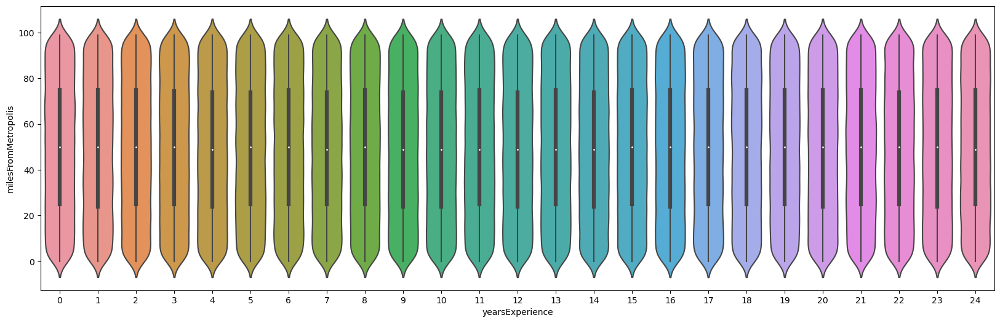

In [73]:
plt.figure(figsize = (20, 6))
sns.violinplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data)

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

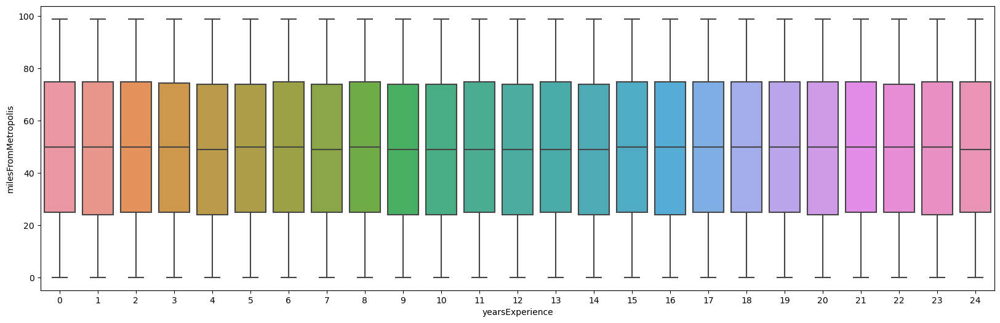

In [74]:
plt.figure(figsize = (20, 6))
sns.boxplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data)

In [75]:
train_data[train_data['milesFromMetropolis']<2]

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
214,CEO,BACHELORS,ENGINEERING,EDUCATION,10,0,146
217,JANITOR,NONE,NONE,FINANCE,14,0,100
261,VICE_PRESIDENT,NONE,NONE,EDUCATION,13,1,95
267,JANITOR,HIGH_SCHOOL,NONE,AUTO,1,0,51
282,JUNIOR,NONE,NONE,WEB,11,1,84
286,CEO,DOCTORAL,COMPSCI,WEB,20,1,194
316,JANITOR,NONE,NONE,AUTO,18,1,96
339,JANITOR,HIGH_SCHOOL,NONE,WEB,21,1,163
391,CFO,HIGH_SCHOOL,NONE,EDUCATION,8,0,131
444,SENIOR,BACHELORS,MATH,HEALTH,6,0,100


<AxesSubplot:xlabel='yearsExperience', ylabel='salary'>

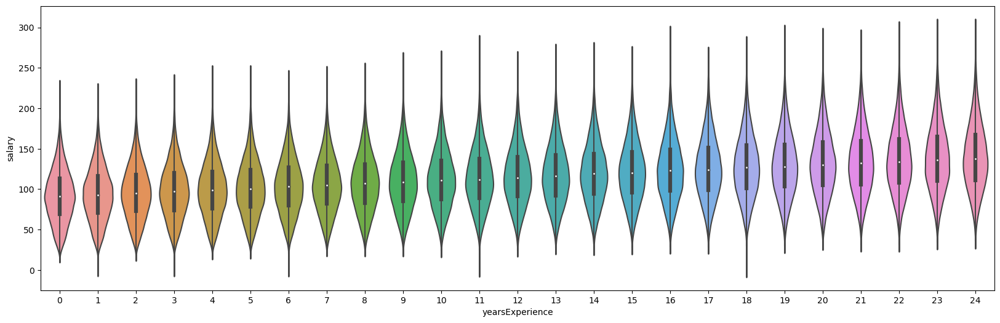

In [76]:
plt.figure(figsize = (20, 6))
sns.violinplot(x = 'yearsExperience', y = 'salary', data = train_data)

<AxesSubplot:xlabel='milesFromMetropolis', ylabel='salary'>

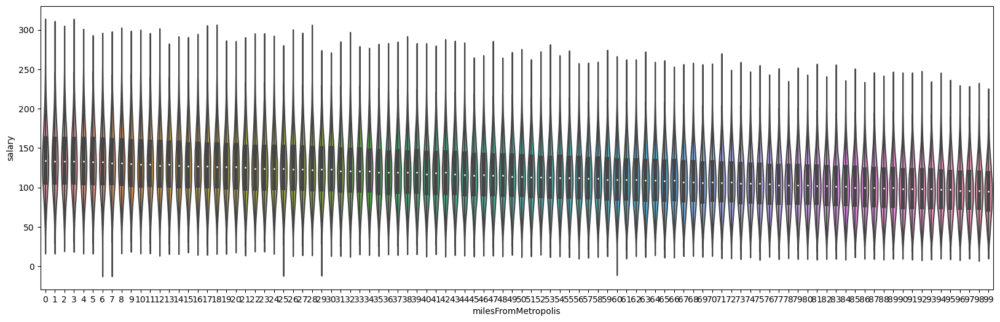

In [77]:
plt.figure(figsize = (20, 6))
sns.violinplot(x = 'milesFromMetropolis', y = 'salary', data = train_data)

# Boxen Plot

<AxesSubplot:xlabel='yearsExperience', ylabel='salary'>

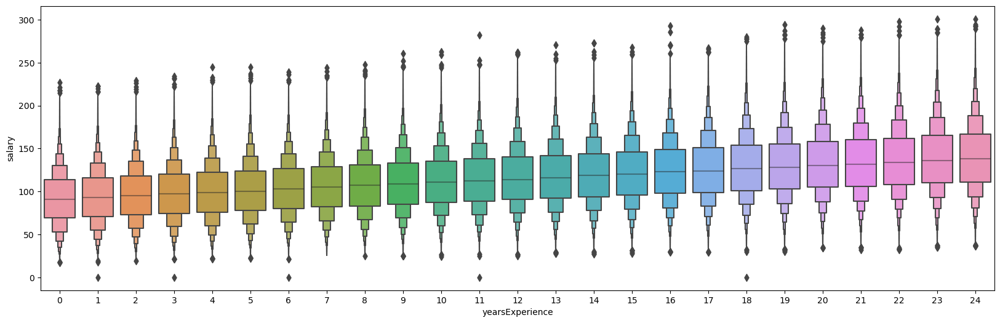

In [78]:
plt.figure(figsize = (20, 6))
sns.boxenplot(x = 'yearsExperience', y = 'salary', data = train_data)

In [79]:
g = train_data[train_data['yearsExperience']==0]

In [80]:
type(g)

pandas.core.frame.DataFrame

In [81]:
g.columns

Index(['jobType', 'degree', 'major', 'industry', 'yearsExperience',
       'milesFromMetropolis', 'salary'],
      dtype='object')

In [82]:
g.count()

jobType                39839
degree                 39839
major                  39839
industry               39839
yearsExperience        39839
milesFromMetropolis    39839
salary                 39839
dtype: int64

In [83]:
g['salary'].quantile(q = 0.9375)

144.0

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

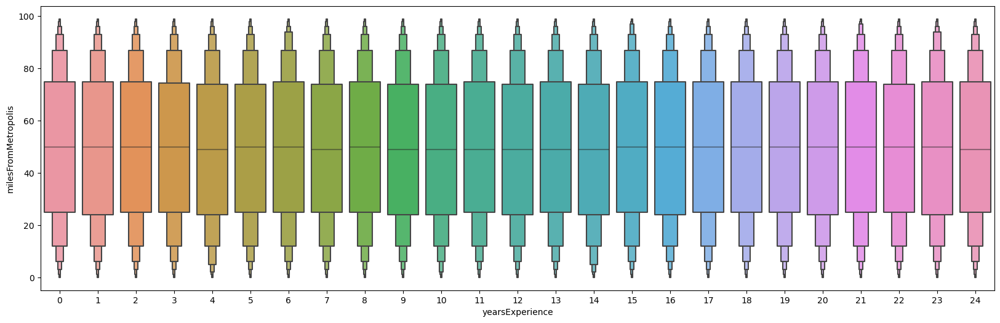

In [84]:
plt.figure(figsize = (20, 6))
sns.boxenplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data)

In [85]:
g['milesFromMetropolis'].quantile(q = 0.75)

75.0

<AxesSubplot:xlabel='milesFromMetropolis', ylabel='salary'>

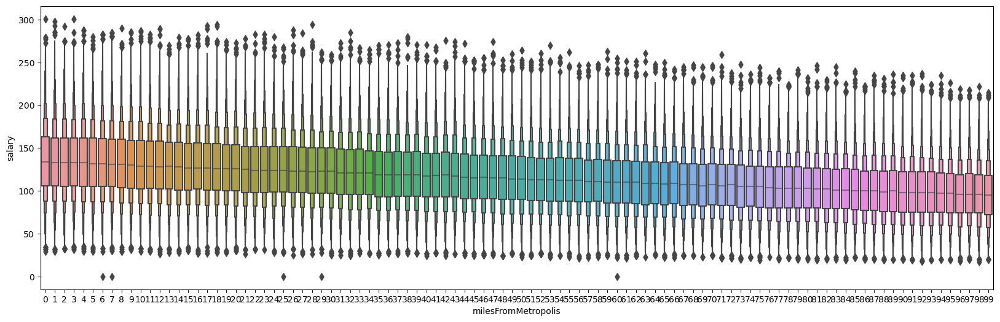

In [86]:
plt.figure(figsize = (20, 6))
lpod = sns.boxenplot(x = 'milesFromMetropolis', y = 'salary', data = train_data)
lpod

In [87]:
type(lpod)

matplotlib.axes._subplots.AxesSubplot

In [88]:
g1 = train_data[train_data['milesFromMetropolis']==0]
g1.count()

jobType                10123
degree                 10123
major                  10123
industry               10123
yearsExperience        10123
milesFromMetropolis    10123
salary                 10123
dtype: int64

In [89]:
g1['salary'].quantile(q =0.5)

134.0

# POINT PLOT

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

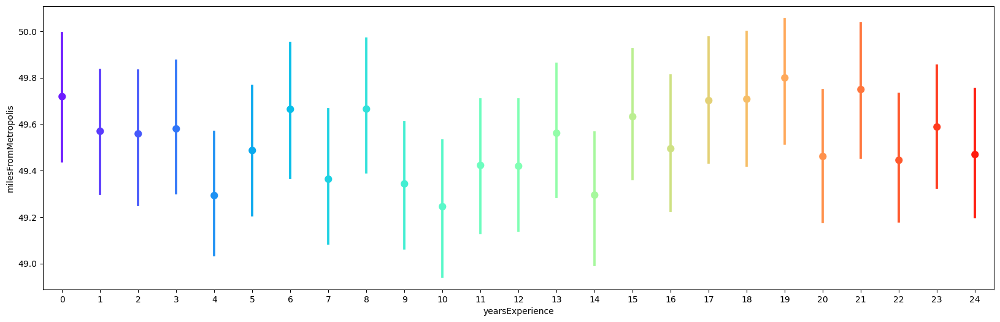

In [90]:
plt.figure(figsize = (20, 6))
sns.pointplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data, palette = 'rainbow')

In [91]:
g3 = train_data[train_data['yearsExperience']==0]
g3.count()

jobType                39839
degree                 39839
major                  39839
industry               39839
yearsExperience        39839
milesFromMetropolis    39839
salary                 39839
dtype: int64

<AxesSubplot:xlabel='yearsExperience', ylabel='salary'>

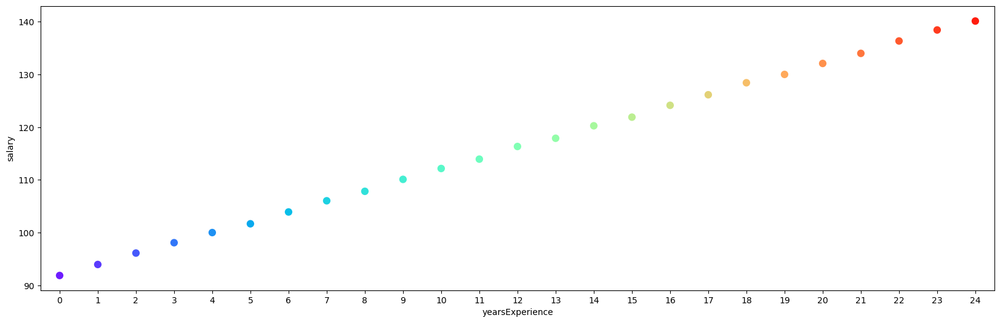

In [92]:
plt.figure(figsize = (20, 6))
sns.pointplot(x = 'yearsExperience', y = 'salary', data = train_data, palette = 'rainbow')

In [93]:
g3.head(10)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
45,VICE_PRESIDENT,MASTERS,LITERATURE,OIL,0,76,112
85,MANAGER,MASTERS,BIOLOGY,SERVICE,0,93,84
108,VICE_PRESIDENT,BACHELORS,BIOLOGY,FINANCE,0,16,117
138,VICE_PRESIDENT,HIGH_SCHOOL,NONE,WEB,0,10,125
175,CFO,NONE,NONE,WEB,0,31,123
178,MANAGER,DOCTORAL,MATH,OIL,0,87,85
231,CTO,DOCTORAL,MATH,WEB,0,19,170
243,CTO,MASTERS,BUSINESS,HEALTH,0,5,108
262,MANAGER,MASTERS,LITERATURE,AUTO,0,84,88
331,MANAGER,MASTERS,MATH,EDUCATION,0,2,95


<AxesSubplot:xlabel='milesFromMetropolis', ylabel='salary'>

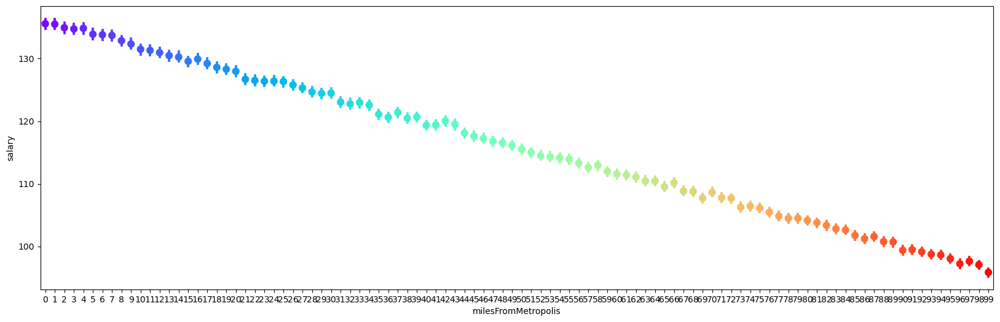

In [94]:
plt.figure(figsize = (20, 6))
sns.pointplot(x = 'milesFromMetropolis', y = 'salary', data = train_data, palette = 'rainbow')

# Count Plot

## It just gives the count of all the observations of the column(of the dataframe) on X-axis.

<AxesSubplot:xlabel='yearsExperience', ylabel='count'>

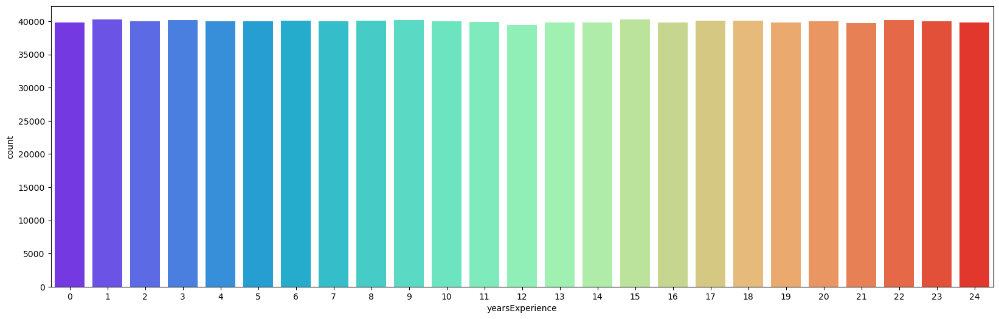

In [95]:
plt.figure(figsize = (20, 6))
sns.countplot(x = 'yearsExperience', data = train_data, palette = 'rainbow')

<AxesSubplot:xlabel='milesFromMetropolis', ylabel='count'>

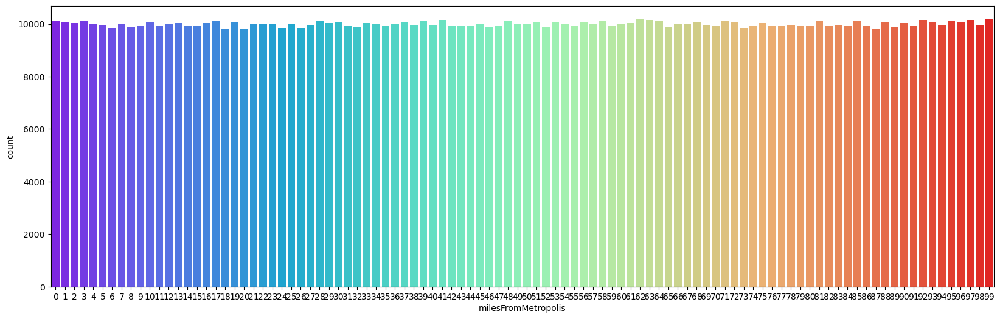

In [96]:
plt.figure(figsize = (20, 6))
sns.countplot(x = 'milesFromMetropolis', data = train_data, palette = 'rainbow')

<AxesSubplot:xlabel='salary', ylabel='count'>

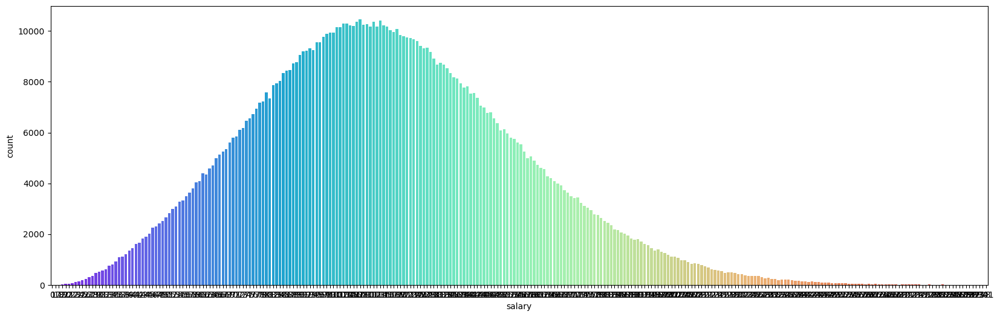

In [97]:
plt.figure(figsize = (20, 6))
sns.countplot(x = 'salary', data = train_data, palette = 'rainbow')

In [98]:
train_data['salary'].value_counts()

108    10467
114    10407
107    10371
112    10361
104    10297
103    10285
110    10270
109    10243
115    10227
105    10223
106    10204
113    10182
111    10179
116    10169
102    10158
101    10151
119    10080
117    10041
118     9968
99      9946
100     9937
98      9898
120     9835
121     9800
97      9773
122     9748
123     9723
124     9685
125     9594
95      9567
96      9565
126     9416
128     9353
127     9325
93      9320
94      9236
92      9228
91      9189
129     9185
90      9066
130     8909
89      8775
132     8752
88      8724
131     8679
133     8674
134     8532
87      8472
86      8434
135     8350
85      8346
136     8182
137     8127
84      8026
138     7941
83      7930
82      7879
140     7816
139     7774
80      7588
142     7565
141     7536
143     7358
81      7353
79      7221
78      7166
144     7057
145     6987
77      6933
147     6786
146     6767
76      6730
148     6556
75      6551
74      6464
149     6369
73      6173

In [99]:
train_data[train_data['salary']==280]

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
39220,CEO,MASTERS,MATH,WEB,24,5,280
158301,CEO,MASTERS,BUSINESS,OIL,18,7,280
407449,CEO,DOCTORAL,ENGINEERING,OIL,23,38,280
696306,CEO,DOCTORAL,PHYSICS,OIL,23,24,280


In [100]:
train_data['salary'].max()

301

In [101]:
train_data['salary'].min()

0

# SWARM PLOT

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

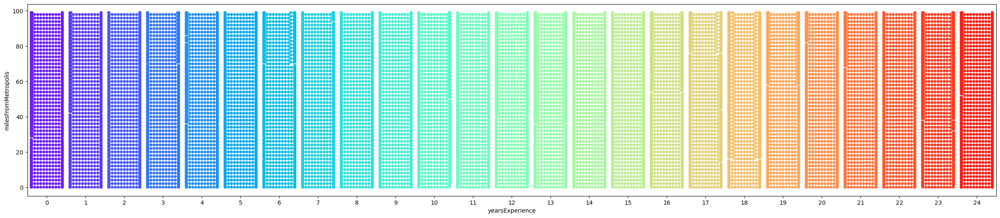

In [102]:
plt.figure(figsize = (30, 6))
sns.swarmplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data.iloc[1:50000], palette = 'rainbow')

In [103]:
g3 = train_data[train_data['yearsExperience']==0]
g3.count()

jobType                39839
degree                 39839
major                  39839
industry               39839
yearsExperience        39839
milesFromMetropolis    39839
salary                 39839
dtype: int64

In [104]:
g5 = g3[g3['milesFromMetropolis']==0]
g5.count()

jobType                418
degree                 418
major                  418
industry               418
yearsExperience        418
milesFromMetropolis    418
salary                 418
dtype: int64

<AxesSubplot:xlabel='yearsExperience', ylabel='salary'>

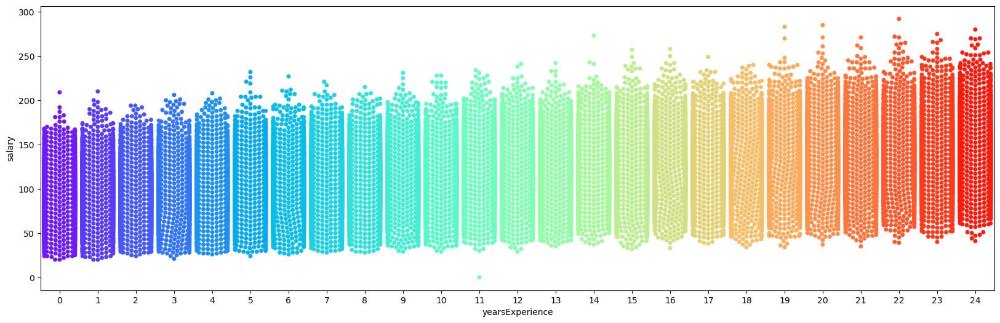

In [105]:
plt.figure(figsize = (20, 6))
sns.swarmplot(x = 'yearsExperience', y = 'salary', data = train_data.iloc[1:50000], palette = 'rainbow')

In [106]:
g3[g3['salary']>220].count()

jobType                2
degree                 2
major                  2
industry               2
yearsExperience        2
milesFromMetropolis    2
salary                 2
dtype: int64

# COMBINE PLOT

<AxesSubplot:xlabel='yearsExperience', ylabel='milesFromMetropolis'>

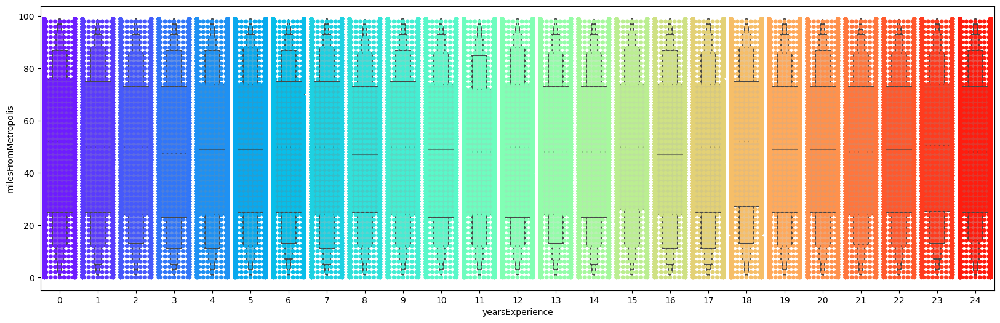

In [107]:
plt.figure(figsize = (20, 6))
sns.boxenplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data.iloc[1:50000], palette = 'rainbow')
sns.swarmplot(x = 'yearsExperience', y = 'milesFromMetropolis', data = train_data.iloc[1:50000], palette = 'rainbow')

In [108]:
x = np.array([1,2,3,4,5,6])
x.shape

(6,)

In [109]:
x = x.reshape(-1, 1)
x.shape

(6, 1)

In [110]:
train_data.head(1)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,CFO,MASTERS,MATH,HEALTH,10,83,130


In [111]:
train_data.columns

Index(['jobType', 'degree', 'major', 'industry', 'yearsExperience',
       'milesFromMetropolis', 'salary'],
      dtype='object')

In [112]:
train_for_vif = train_data.drop(['jobType', 'degree', 'major', 'industry', 'salary'], axis =1)

In [113]:
train_for_vif.head(1)


,yearsExperience,milesFromMetropolis
0,10,83


In [114]:
target = train_data['salary']

In [115]:
type(target)

pandas.core.series.Series

In [116]:
names = ['yearsExperience', 'milesFromMetropolis']
print(type(names[0]))

<class 'str'>


In [117]:
#from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

In [118]:
for i in range(0, len(names)):
    y = train_for_vif.loc[:, train_for_vif.columns == names[i]] 
    x = train_for_vif.loc[:, train_for_vif.columns!= names[i]]
    model = sm.OLS(y,x)
    results = model.fit()
    print(results)
    rsq = results.rsquared
    print(rsq)
    vif = round(1/(1-rsq), 2)
    print("R Square value of {} columns is {} keeping all other columns as features".format(names[i],(round(rsq, 2))))
    print("Variance inflation Factor of {} columns is {} \n".format(names[i], vif))

0.5483256412061387
R Square value of yearsExperience columns is 0.55 keeping all other columns as features
Variance inflation Factor of yearsExperience columns is 2.21 

0.5483256412061392
R Square value of milesFromMetropolis columns is 0.55 keeping all other columns as features
Variance inflation Factor of milesFromMetropolis columns is 2.21 



# ANOVA TEST

In [119]:
def perform_anova_test(x, y):
    # two variables of interest
    train_anova = train_data[[x, y]]
    groups = train_anova.groupby(x).count().reset_index()
    print(type(groups))
    print(groups)
    
    unique_majors = train_anova[x].unique()
    print(unique_majors)
    print(type(unique_majors))
    for major in unique_majors:
        stats.probplot(train_anova[train_anova[x] == major][y], dist = 'norm', plot = plt)
        plt.title('Probability Plot -' + str(major))
        plt.show()
 #Calculate the ratio of the largest to the smallest sample standard deviation 
    ratio = train_anova.groupby(x).std().max() / train_anova.groupby(x).std().min()
    print(train_anova.groupby(x).std().max())
    print(ratio)        

    # Create ANOVA Backbone table
    data = [['Between Groups', '', '', '', '', '', ''], ['Within Groups', '', '', '', '', '', ''], ['Total', '', '', '', '', '', '']]
    anova_table = pd.DataFrame(data, columns = ['Source of Variation', 'SS', 'df', 'MS', 'F', 'P-value', 'F crit'])
    print(anova_table)
    anova_table.set_index('Source of Variation', inplace = True)    

#Calculate SSTR and update ANOVA table
    
    x_bar = train_anova[y].mean()
    SSTR = train_anova.groupby(x).count() * (train_anova.groupby(x).mean() - x_bar)**2
    print('----------------Please be careful---------')
    print(type(SSTR))
    print(SSTR)
    anova_table['SS']['Between Groups'] = SSTR[y].sum() 
    print(anova_table)
    
    #Calculate SSE and update ANOVA table
    
    SSE = (train_anova.groupby(x).count() - 1) * (train_anova.groupby(x).std()**2)
    anova_table['SS']['Within Groups'] = SSE[y].sum()
    print(anova_table)
    
    #Calculate SSTR and update ANOVA table
    
    SSTR = SSTR[y].sum() + SSE[y].sum()
    anova_table['SS']['Total'] = SSTR
    print('---------------------------------------------------')
    print(anova_table)
    
    # Update degree of freedom
    
    anova_table['df']['Between Groups'] = train_anova[x].nunique() - 1
    anova_table['df']['Within Groups'] = train_anova.shape[0] - train_anova[x].nunique()
    anova_table['df']['Total'] = train_anova.shape[0]    
    print(anova_table)
    print('----------------------------------------------------------------------------------')
    # Calculate MS
    
    anova_table['MS'] = anova_table['SS'] / anova_table['df']
    print(anova_table)
    print('----------------------------------------------------------------------------------')
    
    #Calculate F
    
    F = anova_table['MS']['Between Groups'] / anova_table['MS']['Within Groups']
    anova_table['F']['Between Groups'] = F
    print(anova_table)
    print('----------------------------------------------------------------------------------')
    
    #P-value
    
    anova_table['P-value']['Between Groups'] = 1 - stats.f.cdf(F, anova_table['df']['Between Groups'], anova_table['df']['Within Groups'])
    print(anova_table)
    print('----------------------------------------------------------------------------------')     
    
    # F- Critical
    
    alpha = 0.05
    
    # Possible types right-tailed, left-tailed, two-tailed
    
    tail_hypothesis_type = 'two-tailed'
    if tail_hypothesis_type == 'two-tailed':
        alpha /=2 
    anova_table['F crit']['Between Groups'] = stats.f.ppf(1-alpha, anova_table['df']['Between Groups'], anova_table['df']['Within Groups']) 
    print(anova_table)
    print('----------------------------------------------------------------------------------')    
    
    # The P-value approach
    
    print('Approach 1: The p-value approach to hypothesis testing in the decision rule')
    conclusion = 'Failed to reject the Null Hypothesis'
    
    if anova_table['P-value']['Between Groups'] <= alpha:
        conclusion = 'Null Hypothesis rejected'
        
    print('F-score:', anova_table['F']['Between Groups'], 'and p value is:', anova_table['P-value']['Between Groups'])
    print(conclusion)
    
    # The Critical value approach
    
    print('\n-----------------------------------------------------------------------')
    print('Approach 2: The Critical value approach to hypothesis testing in the decision rule')
    conclusion = 'Failed to reject the null hypothesis.'
    if anova_table['F']['Between Groups'] > anova_table['F crit']['Between Groups']:
        conclusion = 'Null Hypothesis rejected'
    print('F-score:', anova_table['F']['Between Groups'], 'and critical value is:', anova_table['F crit']['Between Groups'])
    print(conclusion)

<class 'pandas.core.frame.DataFrame'>
         major  salary
0      BIOLOGY   58379
1     BUSINESS   58518
2    CHEMISTRY   58875
3      COMPSCI   58382
4  ENGINEERING   58596
5   LITERATURE   58684
6         MATH   57801
7         NONE  532355
8      PHYSICS   58410
['MATH' 'NONE' 'PHYSICS' 'CHEMISTRY' 'COMPSCI' 'BIOLOGY' 'LITERATURE'
 'BUSINESS' 'ENGINEERING']
<class 'numpy.ndarray'>


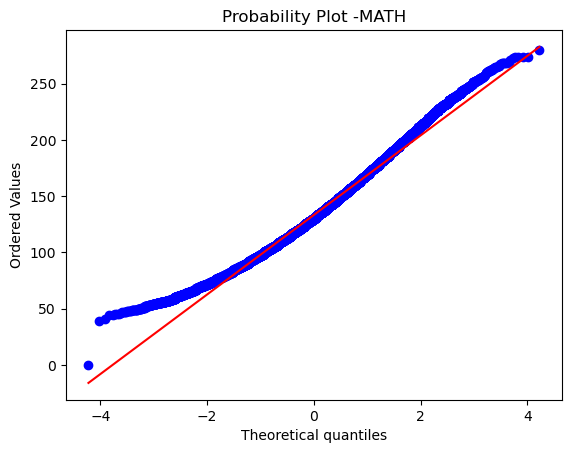

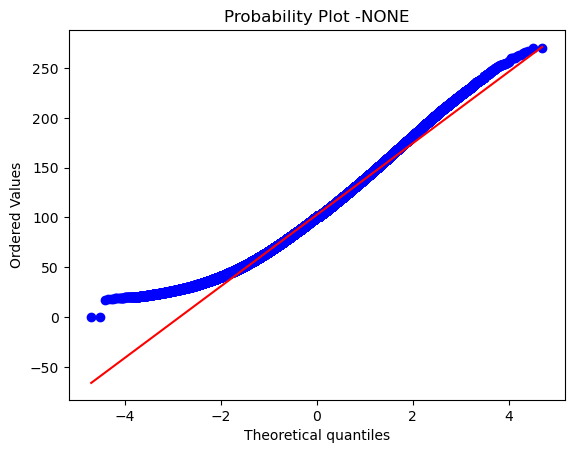

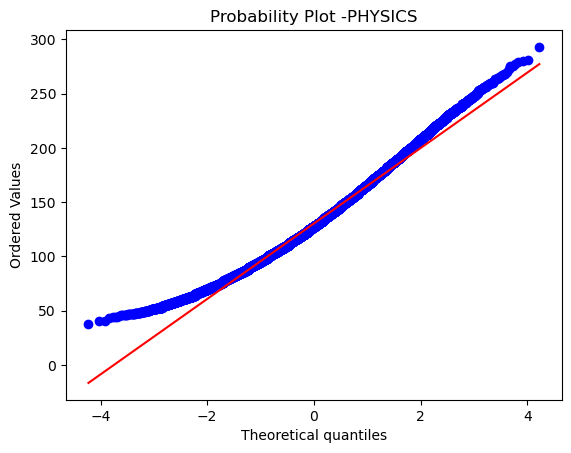

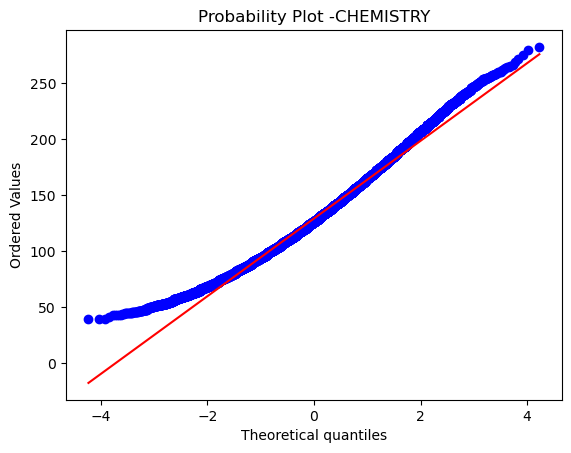

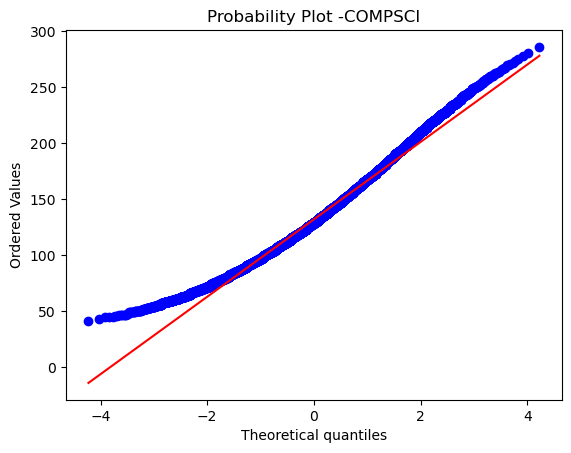

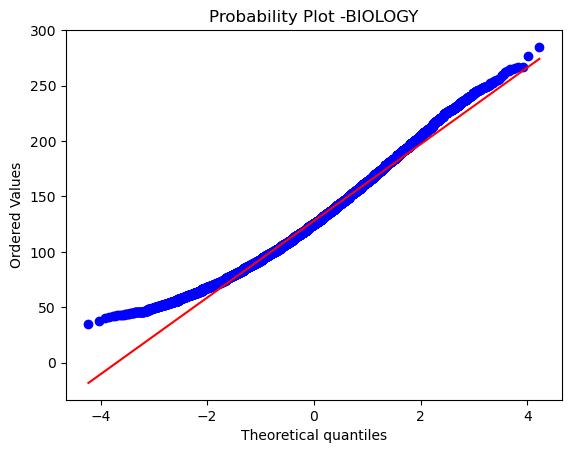

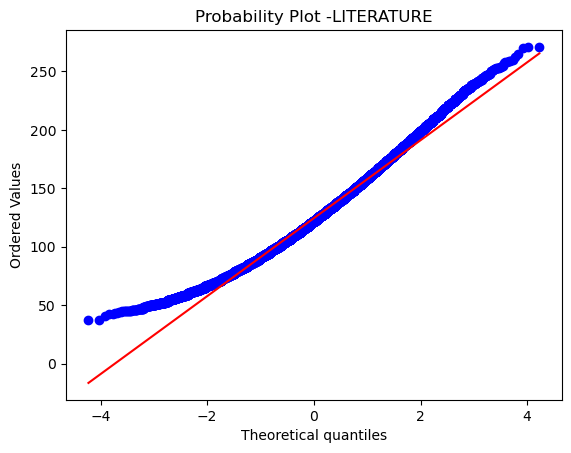

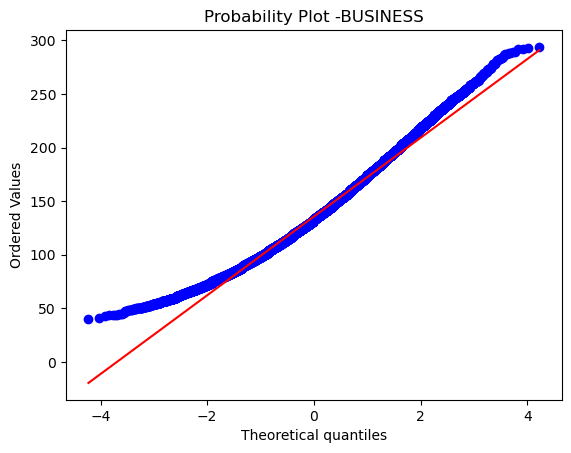

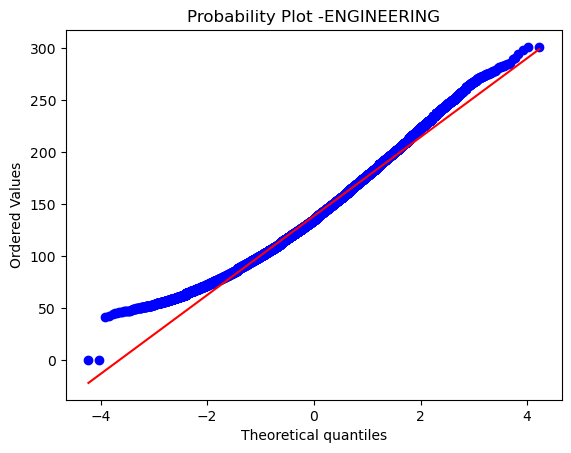

salary    38.186849
dtype: float64
salary    1.137312
dtype: float64
  Source of Variation SS df MS F P-value F crit
0      Between Groups                          
1       Within Groups                          
2               Total                          
----------------Please be careful---------
<class 'pandas.core.frame.DataFrame'>
                   salary
major                    
BIOLOGY      8.226593e+06
BUSINESS     2.245083e+07
CHEMISTRY    9.965597e+06
COMPSCI      1.497156e+07
ENGINEERING  2.933501e+07
LITERATURE   4.102656e+06
MATH         1.721520e+07
NONE         9.671060e+07
PHYSICS      1.196201e+07
                                   SS df MS F P-value F crit
Source of Variation                                         
Between Groups       214940060.760225                       
Within Groups                                               
Total                                                       
                                    SS df MS F P-value F crit
Sourc

In [120]:
perform_anova_test('major', 'salary')

In [121]:
a = train_data[train_data['major'] == 'MATH'].sort_values(by = 'salary')

In [122]:
a.head(100)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
30559,JUNIOR,DOCTORAL,MATH,AUTO,11,7,0
904692,JUNIOR,BACHELORS,MATH,EDUCATION,1,99,39
752320,JUNIOR,BACHELORS,MATH,EDUCATION,0,91,41
458368,JUNIOR,BACHELORS,MATH,EDUCATION,1,83,44
742936,JUNIOR,BACHELORS,MATH,EDUCATION,0,77,44
939736,JUNIOR,BACHELORS,MATH,EDUCATION,4,88,45
93654,JUNIOR,BACHELORS,MATH,SERVICE,0,94,45
794352,JUNIOR,MASTERS,MATH,EDUCATION,1,84,45
936622,JUNIOR,BACHELORS,MATH,SERVICE,0,89,46
656501,JUNIOR,BACHELORS,MATH,EDUCATION,1,48,47


# DENDROGRAM

In [123]:
X = train_data[1:50000]


In [124]:
from scipy.cluster import hierarchy as hc

In [125]:
corr = np.round_(stats.spearmanr(X).correlation, 4)

In [126]:
corr

array([[ 1.000e+00, -2.090e-02, -2.450e-02,  1.800e-03, -0.000e+00,
         2.700e-03, -2.313e-01],
       [-2.090e-02,  1.000e+00,  3.680e-01, -5.000e-03,  4.000e-03,
         5.900e-03, -2.363e-01],
       [-2.450e-02,  3.680e-01,  1.000e+00, -1.030e-02, -4.000e-03,
         8.900e-03, -2.678e-01],
       [ 1.800e-03, -5.000e-03, -1.030e-02,  1.000e+00,  2.500e-03,
         2.200e-03,  7.750e-02],
       [-0.000e+00,  4.000e-03, -4.000e-03,  2.500e-03,  1.000e+00,
         1.000e-04,  3.637e-01],
       [ 2.700e-03,  5.900e-03,  8.900e-03,  2.200e-03,  1.000e-04,
         1.000e+00, -2.873e-01],
       [-2.313e-01, -2.363e-01, -2.678e-01,  7.750e-02,  3.637e-01,
        -2.873e-01,  1.000e+00]])

In [127]:
corr_condensed = hc.distance.squareform(1-corr)

In [128]:
z = hc.linkage(corr_condensed, method = 'average')
z

array([[ 1.        ,  2.        ,  0.632     ,  2.        ],
       [ 4.        ,  6.        ,  0.6363    ,  2.        ],
       [ 3.        ,  8.        ,  0.96      ,  3.        ],
       [ 5.        ,  7.        ,  0.9926    ,  3.        ],
       [ 0.        , 10.        ,  1.01423333,  4.        ],
       [ 9.        , 11.        ,  1.08615833,  7.        ]])

In [129]:
fig = plt.figure(figsize = (16, 10))

<Figure size 1600x1000 with 0 Axes>

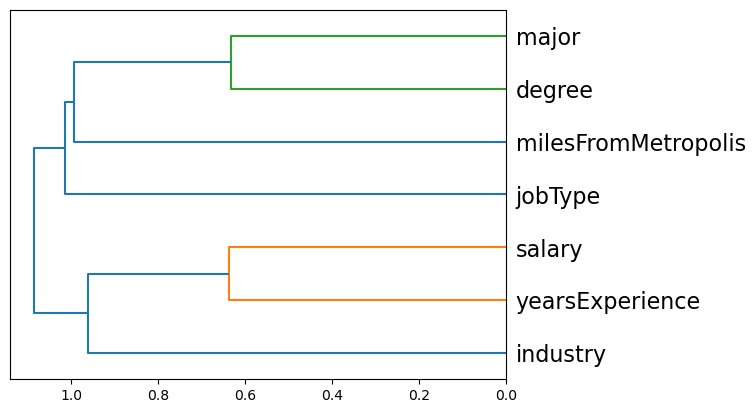

In [130]:
dendrogram = hc.dendrogram(z, labels = X.columns, orientation = 'left', leaf_font_size = 16)

# SCALING

In [131]:
#Helper function for scaling all the numerical data using MinMaxScaler

def scale_data(df, col):
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    
    df[col] = scaler.fit_transform(df[col])
    #print(df[col])
    return df


In [132]:
# Making a list of column names to be scaled

col_train = ["yearsExperience", "milesFromMetropolis"]

#passing data and name for scaling

train_data = scale_data(train_data, col_train)

In [133]:
train_data.head(2)

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,CFO,MASTERS,MATH,HEALTH,0.416667,0.838384,130
1,CEO,HIGH_SCHOOL,NONE,WEB,0.125000,0.737374,101


# MODELLING

In [134]:
from sklearn.preprocessing import OneHotEncoder as Sk

#Class for containing all functionality required for OneHotEncoding

class OneHotEncoder(Sk):

    def __init__(self, **kwargs):
        super(OneHotEncoder, self).__init__(**kwargs)
        self.fit_flag = False
    
#Helper function to fit data

    def fit(self, X, **kwargs):
        out = super().fit(X)
        self.fit_flag = True
        #print('-----------------------------------------------')
        #print(out)
        return out

# Helper function to transform data

    def transform(self, X, **kwargs):
        #print('--------------------------------------------------------')
        #print(X.head())
        sparse_matrix = super(OneHotEncoder, self).transform(X)
        #print('------------------------------------------------------------')
        #print(sparse_matrix)
        new_columns = self.get_new_columns(X=X)
        #print('------------------------------------------------------------')
        #print(type(new_columns))
        d_out = pd.DataFrame(sparse_matrix.toarray(), columns = new_columns, index = X.index)
        return d_out

#Helper function to fit and transform data

    def fit_transform(self, X, **kwargs):
        self.fit(X)
        return self.transform(X)

# Helper function to get new column names after fitting and transforming data

    def get_new_columns(self, X):
        new_columns = []
        for i, column in enumerate(X.columns):
            
            j = 0
            #print(self.categories_[i])
            while j<len(self.categories_[i]):
                new_columns.append(f'{column}{self.categories_[i][j]}')
                j+=1
        return new_columns

In [135]:
#Split the labels and the target

train_X = train_data.drop(['salary', 'yearsExperience', 'milesFromMetropolis'], axis = 1)
train_Y = train_data['salary']

In [136]:
# Looking at Features
train_X.head()

,jobType,degree,major,industry
0,CFO,MASTERS,MATH,HEALTH
1,CEO,HIGH_SCHOOL,NONE,WEB
2,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH
3,MANAGER,DOCTORAL,CHEMISTRY,AUTO
4,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE


In [137]:
train_Y.head()

0    130
1    101
2    137
3    142
4    163
Name: salary, dtype: int64

In [138]:
len(train_X)

1000000

In [139]:
# Passing the features dataframe(train_X) for one-hot encoding process

encoder = OneHotEncoder()
train_X = encoder.fit_transform(train_X)
train_X = train_X.join(train_data['yearsExperience'])
train_X = train_X.join(train_data['milesFromMetropolis'])
train_X.head()

,jobTypeCEO,jobTypeCFO,jobTypeCTO,jobTypeJANITOR,jobTypeJUNIOR,jobTypeMANAGER,jobTypeSENIOR,jobTypeVICE_PRESIDENT,degreeBACHELORS,degreeDOCTORAL,...,majorPHYSICS,industryAUTO,industryEDUCATION,industryFINANCE,industryHEALTH,industryOIL,industrySERVICE,industryWEB,yearsExperience,milesFromMetropolis
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.416667,0.838384
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.125000,0.737374
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.416667,0.383838
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.171717
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.333333,0.161616


In [140]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(train_X, train_Y, test_size = 0.2)

In [141]:
# importing required libraries for getting the metrics of models

import math
import sklearn.metrics as metrics
from sklearn.metrics import median_absolute_error

# Function for calculating RMSE

def rmse(x, y):
    return math.sqrt(((x-y)**2).mean())

# Function for calculating all relevant metrics

def print_score(m):
    res = [rmse(m.predict(X_train), Y_train), rmse(m.predict(X_test), Y_test),
            m.score(X_train, Y_train), m.score(X_test, Y_test),
            median_absolute_error(m.predict(X_train), Y_train), median_absolute_error(m.predict(X_test), Y_test),
            metrics.mean_absolute_error(m.predict(X_train), Y_train), metrics.mean_absolute_error(m.predict(X_test), Y_test)     
        
    ]
    
    print('RMSE-Train : ', str(res[0]), '\n RMSE-Test: ', str(res[1]), '\n Score-Train: ', str(res[2]), '\n Score-Test: ', str(res[3]),
          '\n MedAE-Train: ', str(res[4]), '\n MedAE-Test: ', str(res[5]), '\n MeanAE-Train', str(res[6]), '\n MeanAE-Test', str(res[7]))

In [142]:
# Visualizing the importance of all the features in the dataset for prediction.

def visualize_importance(feature_importances, feat_train_df):
    
    # Creating a dataframe for feature name and feature importance 
    
    feature_importance_df = pd.DataFrame()
    
    _df = pd.DataFrame()
    _df['feature_importance'] = feature_importances
    _df['column'] = feat_train_df.columns
    
    feature_importance_df = pd.concat([feature_importance_df, _df], axis = 0, ignore_index = True)
    
    # Grouping all data and sorting in descending order
    
    order = feature_importance_df.groupby('column')\
            .sum()[['feature_importance']]\
            .sort_values('feature_importance', ascending = False).index[:50]
    
    #Plotting feature importance data using boxen plot
    
    fig, ax = plt.subplots(figsize = (8, max(6, len(order) * .25)))
    print(type(fig))
    print(type(ax))
    sns.boxenplot(data = feature_importance_df,
                  x = 'feature_importance',
                  y = 'column',
                  order = order,
                  ax = ax,
                  palette = 'viridis',
                  orient = 'h')
    ax.tick_params(axis = 'x', rotation = 0)
    ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    return fig, ax

# LINEAR REGRESSION

RMSE-Train :  19.61318534458988 
 RMSE-Test:  19.58643095565712 
 Score-Train:  0.7436247141341957 
 Score-Test:  0.7431520897641806 
 MedAE-Train:  13.7265625 
 MedAE-Test:  13.7432861328125 
 MeanAE-Train 15.845768712768555 
 MeanAE-Test 15.839488768310547
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>
Wall time: 3.53 s


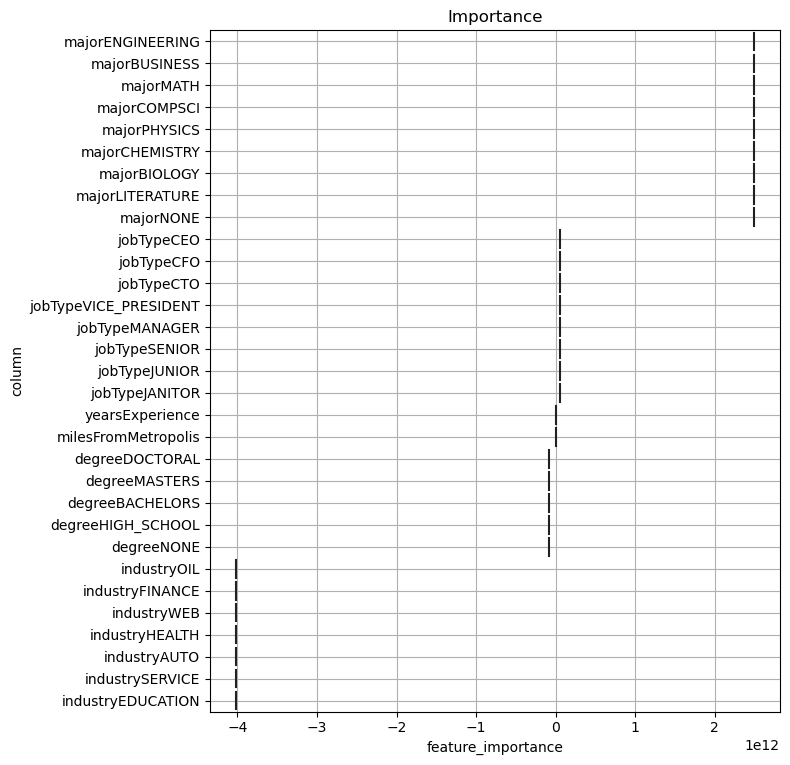

In [143]:
%%time
import time
# Fit a Linear Regression Model to the train dataset

from sklearn.linear_model import LinearRegression

lModel = LinearRegression()
lModel.fit(X_train, Y_train)

# Print score of the model
print_score(lModel)

#lModel_array = [lModel.coef_[0], lModel.coef_[1]]

#Visualizing the imporance of features
fig, ax = visualize_importance(lModel.coef_, train_X)



In [144]:
lModel.coef_

array([ 5.01489619e+10,  5.01489619e+10,  5.01489619e+10,  5.01489618e+10,
        5.01489619e+10,  5.01489619e+10,  5.01489619e+10,  5.01489619e+10,
       -8.04767734e+10, -8.04767734e+10, -8.04767734e+10, -8.04767734e+10,
       -8.04767734e+10,  2.49368442e+12,  2.49368442e+12,  2.49368442e+12,
        2.49368442e+12,  2.49368442e+12,  2.49368442e+12,  2.49368442e+12,
        2.49368442e+12,  2.49368442e+12, -4.01845681e+12, -4.01845681e+12,
       -4.01845681e+12, -4.01845681e+12, -4.01845681e+12, -4.01845681e+12,
       -4.01845681e+12,  4.82912586e+01, -3.95145894e+01])

In [145]:
lModel.coef_[0]

50148961904.06538

 # RANDOM FOREST REGRESSOR

In [146]:
from sklearn.ensemble import RandomForestRegressor

In [147]:
RandomForestRegressor()

RandomForestRegressor()

In [148]:
rf = RandomForestRegressor()
rf

RandomForestRegressor()

In [149]:
rf.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])

RandomForestRegressor()

In [150]:
print_score(rf)

RMSE-Train :  20.002026517419747 
 RMSE-Test:  20.59610988548949 
 Score-Train:  0.7333584101384598 
 Score-Test:  0.7159885656787113 
 MedAE-Train:  13.090000000000003 
 MedAE-Test:  14.030000000000001 
 MeanAE-Train 15.794192236959322 
 MeanAE-Test 16.475651449823232


<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


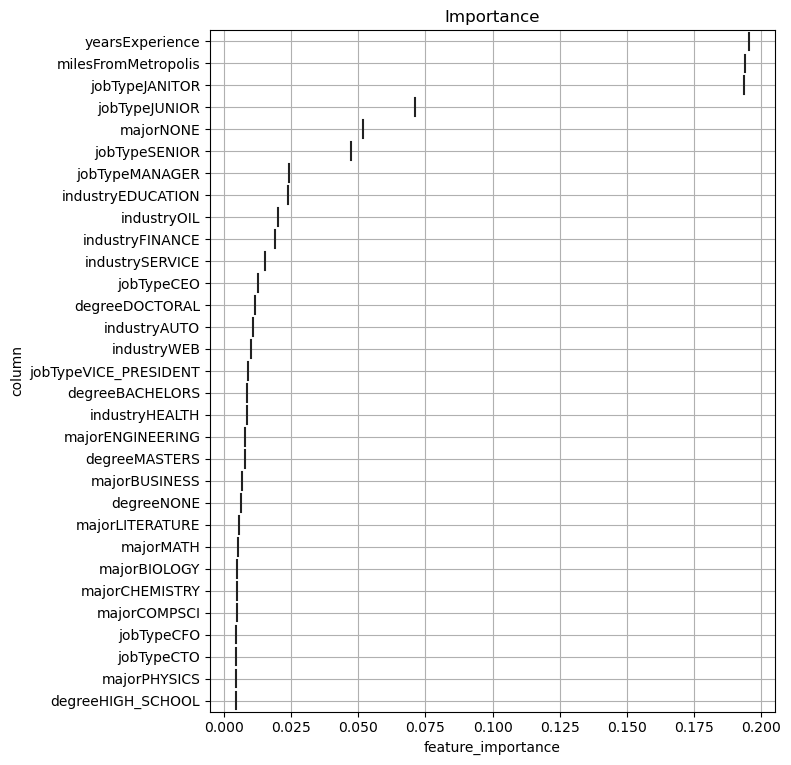

In [151]:
fig, ax = visualize_importance(rf.feature_importances_, train_X.iloc[1:500000])

# KNEIGHBORS REGRESSOR

In [152]:
from sklearn.neighbors import KNeighborsRegressor
knnr = KNeighborsRegressor()
knnr.fit(X_train.iloc[1:10000], Y_train.iloc[1:10000])
#print_score(knnr)

KNeighborsRegressor()

# GRADIENT BOOSTING REGRESSOR

RMSE-Train :  19.4365093019709 
 RMSE-Test:  19.424433204887325 
 Score-Train:  0.7482227801033443 
 Score-Test:  0.7473832549455339 
 MedAE-Train:  13.624144187260086 
 MedAE-Test:  13.66461984767443 
 MeanAE-Train 15.693490770183727 
 MeanAE-Test 15.696308397013224
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


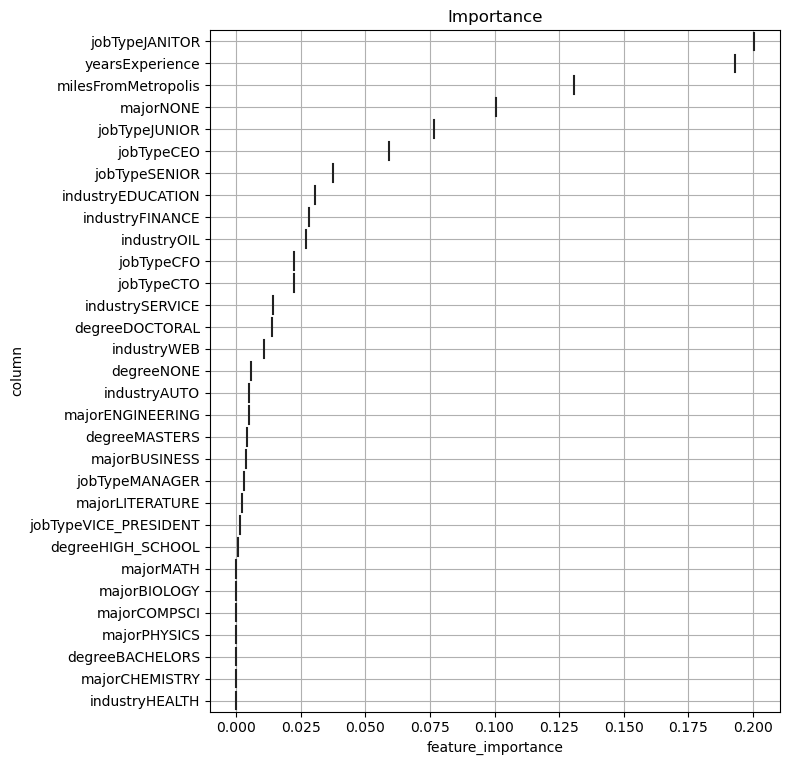

In [153]:
from sklearn.ensemble import GradientBoostingRegressor
GBR = GradientBoostingRegressor()
GBR.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(GBR)
fig, ax = visualize_importance(GBR.feature_importances_, train_X.iloc[1:50000])

# DECISION TREE REGRESSOR

In [154]:
from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor()
DTR.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(DTR)

RMSE-Train :  26.815468023534113 
 RMSE-Test:  27.73311241460988 
 Score-Train:  0.5207626528927521 
 Score-Test:  0.4850528619893312 
 MedAE-Train:  16.0 
 MedAE-Test:  17.0 
 MeanAE-Train 20.247784687499998 
 MeanAE-Test 21.618600416666666


# ADABOOST REGRESSOR

RMSE-Train :  25.444088628751196 
 RMSE-Test:  25.378415278473856 
 Score-Train:  0.5685269326789824 
 Score-Test:  0.5687844395801126 
 MedAE-Train:  19.12369709908326 
 MedAE-Test:  19.07536110529621 
 MeanAE-Train 21.072409514805592 
 MeanAE-Test 21.0096132157672
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


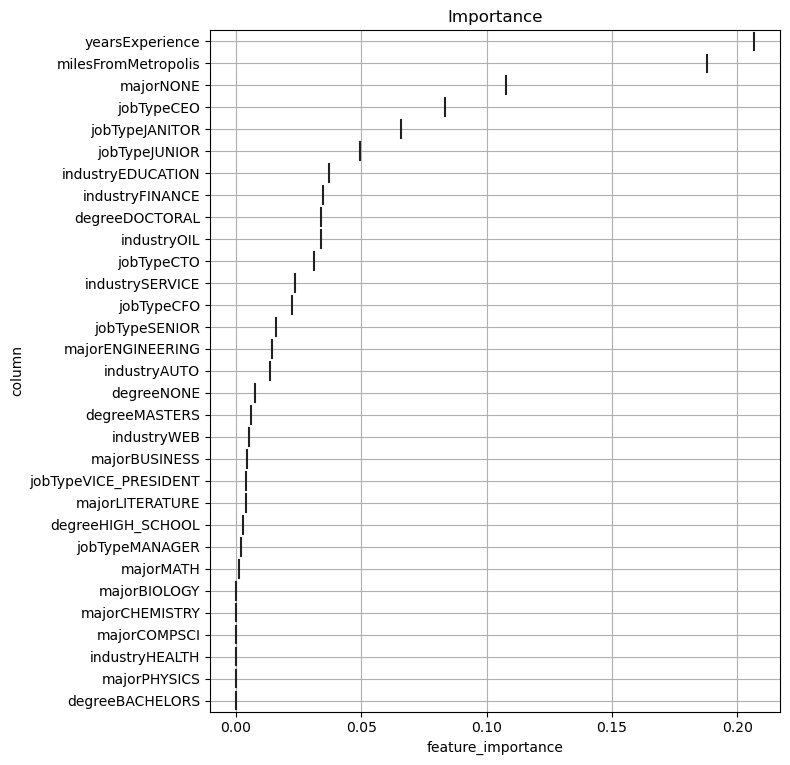

In [155]:
from sklearn.ensemble import AdaBoostRegressor
AdaBoost = AdaBoostRegressor()
AdaBoost.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(AdaBoost)
fig, ax = visualize_importance(AdaBoost.feature_importances_, train_X.iloc[1:50000])

In [156]:
#pip install xgboost

# XGBOOST REGRESSOR

In [157]:
from xgboost import XGBRegressor

In [158]:
xgbr = XGBRegressor()

RMSE-Train :  19.27684884783373 
 RMSE-Test:  19.43154947746804 
 Score-Train:  0.7523422193131888 
 Score-Test:  0.7471981253312608 
 MedAE-Train:  13.416007995605469 
 MedAE-Test:  13.512401580810547 
 MeanAE-Train 15.54607801635027 
 MeanAE-Test 15.682264719972611
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


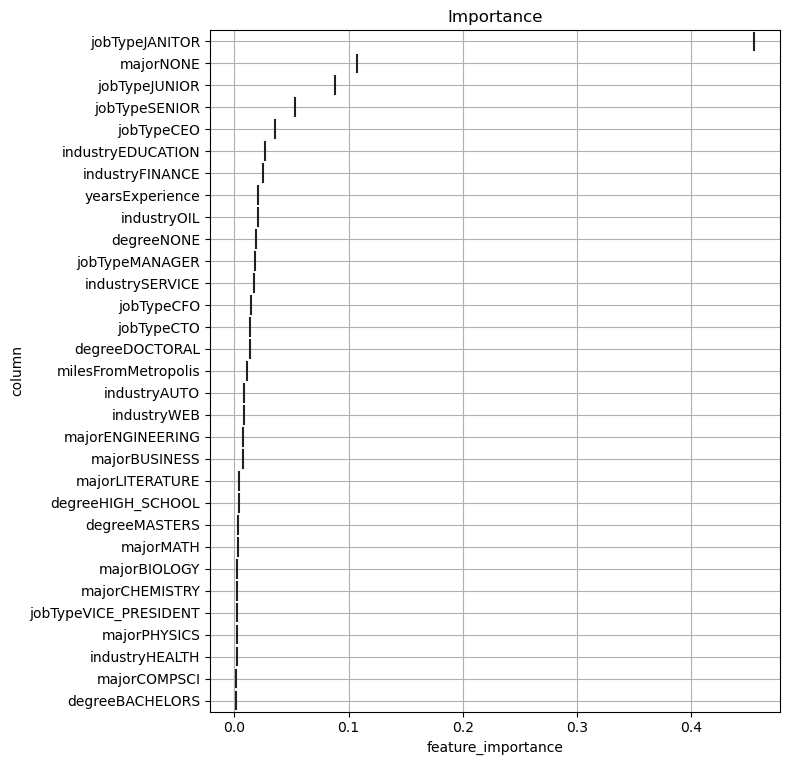

In [159]:
xgbr.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(xgbr)
fig, ax = visualize_importance(xgbr.feature_importances_, train_X.iloc[1:50000])

# LIGHT GRADIENT BOOSTED MACHINE

In [160]:
import lightgbm as lgbm

In [161]:
lg = lgbm.LGBMRegressor()

RMSE-Train :  19.02196046895878 
 RMSE-Test:  19.062665643247183 
 Score-Train:  0.758848236408987 
 Score-Test:  0.7567052790724728 
 MedAE-Train:  13.406864962787687 
 MedAE-Test:  13.456684066921213 
 MeanAE-Train 15.419045018306148 
 MeanAE-Test 15.456251041716163
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


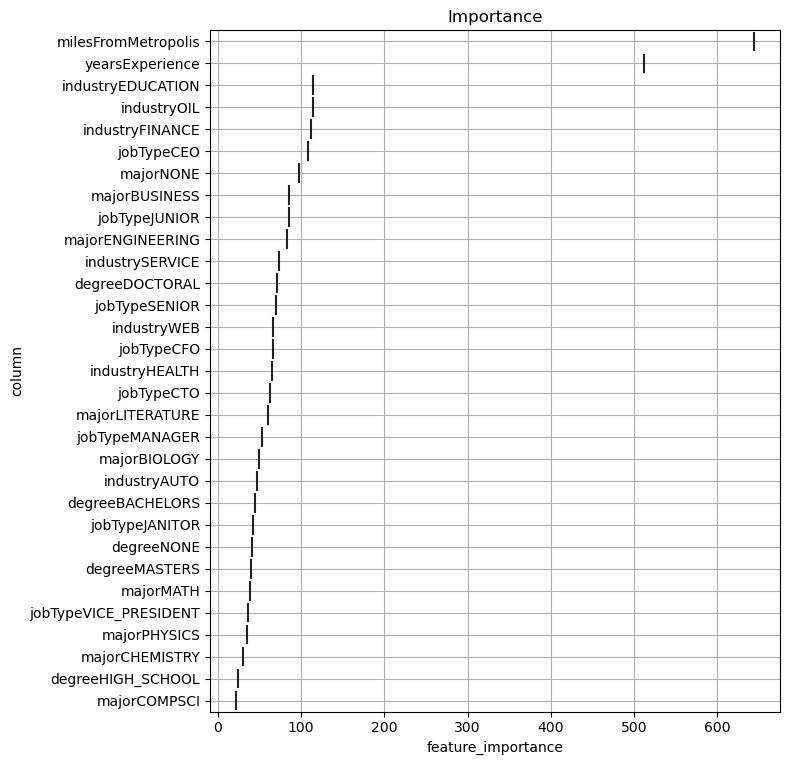

In [162]:
lg.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(lg)
fig, ax = visualize_importance(lg.feature_importances_, train_X.iloc[1:50000])

# COMPARING ALL THE MODELS BASED ON METRICS

In [163]:
def compare_models(models, names, X_train, y_train, X_test, y_test):
    import sklearn.metrics as metrics
    from sklearn.model_selection import train_test_split
    
    # Create a list with the objects
    
    data = {'Metric' : ['rmse', 'MedAE', 'MAE', 'R-Squared']}
    df_train = pd.DataFrame(data)
    df_test = pd.DataFrame(data)
    
    def rmse(x, y):
        return math.sqrt(((x-y)**2).mean())
    
    for (model, name) in zip(models, names):
        y_pred = model.predict(X_test)
        res = [rmse(model.predict(X_train), y_train), rmse(model.predict(X_test), y_test),
                metrics.median_absolute_error(model.predict(X_train), y_train), metrics.median_absolute_error(model.predict(X_test), y_test),
                metrics.mean_absolute_error(model.predict(X_train), y_train), metrics.mean_absolute_error(model.predict(X_test), y_test),     
                metrics.r2_score(model.predict(X_train), y_train), metrics.r2_score(model.predict(X_test), y_test)]    
    
        df_train[name] = [res[0], res[2], res[4], res[6]]     
        df_test[name] = [res[1], res[3], res[5], res[7]]
    return df_train, df_test

In [164]:
#List of Models and List of names

models = [lModel, DTR, rf]#, knnr, GBR, xgbr, AdaBoost]
names = ['Lr', 'Dtree', 'Forest']#, 'Knn', 'GBR', 'Xboost', 'AdaBoost']
comp_model_train, comp_model_test = compare_models(models, names, X_train, Y_train, X_test, Y_test)

# RMSE of all models upon train and test data

In [165]:
print(comp_model_train[:1])
print('\n')
print(comp_model_test[:1])

  Metric         Lr      Dtree     Forest
0   rmse  19.613185  26.815468  20.002027


  Metric         Lr      Dtree    Forest
0   rmse  19.586431  27.733112  20.59611


# ALL METRICS ON TRAIN AND TEST DATA

In [166]:
#Comparing the metrics of models for both Training and Testing sets
print('Results of Training set')
print(comp_model_train)
print('Results of Testing set')
comp_model_test

Results of Training set
Results of Testing set


,Metric,Lr,Dtree,Forest
0,rmse,19.586431,27.733112,20.596110
1,MedAE,13.743286,17.000000,14.030000
2,MAE,15.839489,21.618600,16.475651
3,R-Squared,0.655509,0.498136,0.635868


# Hyperparameter Tuning

In [167]:
def random_Search(model, X_train, Y_train, param_grid):
    from sklearn.model_selection import RandomizedSearchCV
    random = RandomizedSearchCV(estimator = model, param_distributions = param_grid, n_iter = 20, cv = 3, verbose = 2, random_state = 42, n_jobs = -1)
    random.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
    print(random.best_params_)

In [168]:
# Creating a dictionary of parameters for tuning

rf_para_grid = {'n_estimators': [1, 2, 4, 8, 16, 32, 64, 100, 200],
                'max_features' : ['auto', 'sqrt'],
                'max_depth' : np.linspace(1, 32, 32),
                'min_samples_leaf' : np.linspace(0.1, 0.5, 5),
                'bootstrap' : [True, False]}

# Passing the data for hyperparameter tuning using RandomizedSechCV

random_Search(RandomForestRegressor(), X_train, Y_train, param_grid = rf_para_grid)

# As cv = 3, we will have 3 buckets, each time 1 bucket will be considered as Testing set and 
#remaining 2 buckets will be one Training set. So for 3 times, Training set will 
#fit the model(for 20 different combinations of parameters)
#and generates the predictions.
#By considering all the predictions, Randomized Search CV will give 1 combination of parameters
#as output that yields best results (predictions).

Fitting 3 folds for each of 20 candidates, totalling 60 fits
{'n_estimators': 64, 'min_samples_leaf': 0.1, 'max_features': 'auto', 'max_depth': 27.0, 'bootstrap': False}


In [169]:
GBR_para_grid = {'n_estimators': [1, 2, 4, 8, 16, 32, 64, 100, 200],
                 'learning_rate' : [1, 0.5, 0.25, 0.1, 0.05, 0.01],
                 'max_depth' : np.linspace(1, 32, 32),
                  'min_samples_split' : np.linspace(0.1, 1.0, 10)}
random_Search(GradientBoostingRegressor(), X_train, Y_train, param_grid = GBR_para_grid)


Fitting 3 folds for each of 20 candidates, totalling 60 fits
{'n_estimators': 64, 'min_samples_split': 0.1, 'max_depth': 8.0, 'learning_rate': 0.25}


In [170]:
len(X_test)

200000

In [171]:
DTR_para_grid = {
                    'splitter' : ['best', 'random'],
                    'max_depth' : np.linspace(1, 32, 32),
                    'min_samples_leaf' : np.linspace(0.1, 0.5, 5),
                    'min_weight_fraction_leaf' : [0.1, 0.2, 0.5, 0.9],
                    'max_features' : ['auto', 'log2', 'sqrt', None]
}
random_Search(DecisionTreeRegressor(), X_train, Y_train, param_grid = DTR_para_grid)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
{'splitter': 'random', 'min_weight_fraction_leaf': 0.2, 'min_samples_leaf': 0.2, 'max_features': None, 'max_depth': 20.0}


# USING THESE BEST PARAMETERS AND TRAINING THE MODELS

In [172]:
len(train_X.head(1))

1

RMSE-Train :  30.50396833110953 
 RMSE-Test:  30.461188482374645 
 Score-Train:  0.37985595809541417 
 Score-Test:  0.37876042712586067 
 MedAE-Train:  20.93227635447306 
 MedAE-Test:  20.93227635447306 
 MeanAE-Train 24.393175364458543 
 MeanAE-Test 24.381000745412226
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


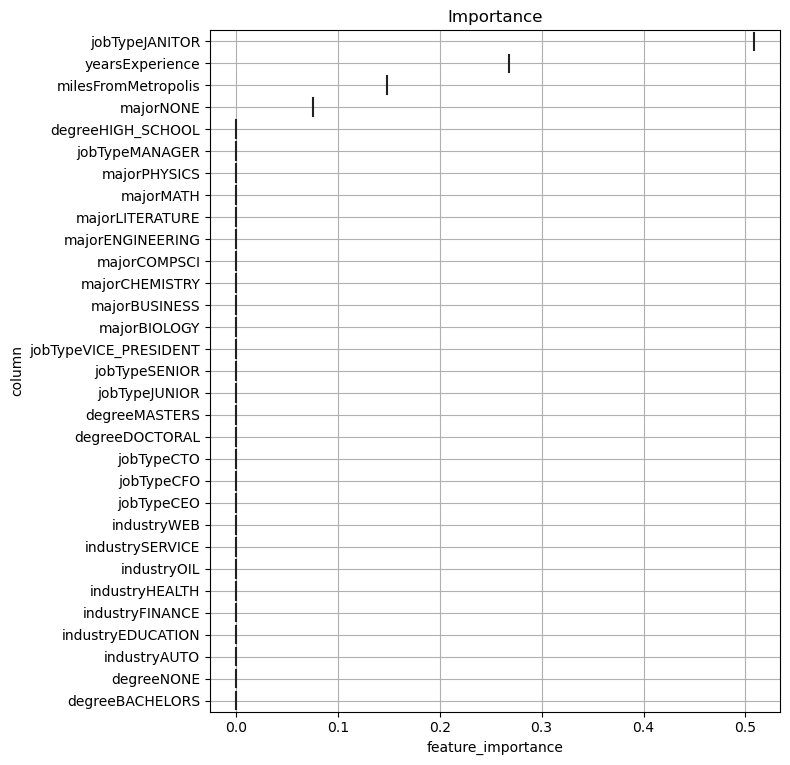

In [173]:
rf = RandomForestRegressor(n_estimators= 64, min_samples_leaf= 0.1, max_features= 'auto', max_depth= 27.0, bootstrap= False)
rf.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(rf)
fig, ax = visualize_importance(rf.feature_importances_, train_X.iloc[1:50000])

RMSE-Train :  19.15187374525595 
 RMSE-Test:  19.168348188938527 
 Score-Train:  0.7555430252430724 
 Score-Test:  0.7540001717140349 
 MedAE-Train:  13.457014377917034 
 MedAE-Test:  13.498343713355517 
 MeanAE-Train 15.512996942615239 
 MeanAE-Test 15.530463665319152
<class 'matplotlib.figure.Figure'>
<class 'matplotlib.axes._subplots.AxesSubplot'>


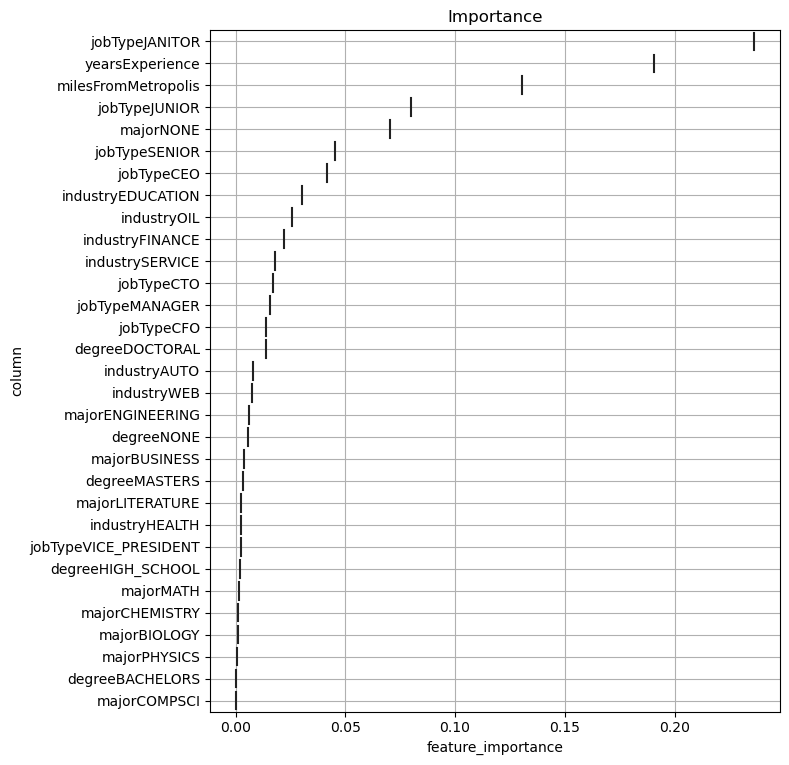

In [174]:
GBR = GradientBoostingRegressor(**{'n_estimators': 64, 'min_samples_split': 0.1, 'max_depth': 8.0, 'learning_rate': 0.25})
GBR.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(GBR)
fig, ax = visualize_importance(GBR.feature_importances_, train_X.iloc[1:50000])

In [175]:
DTR = DecisionTreeRegressor(**{'splitter': 'random', 'min_weight_fraction_leaf': 0.1, 'min_samples_leaf': 0.2, 'max_features': None, 'max_depth': 5.0})
DTR.fit(X_train.iloc[1:50000], Y_train.iloc[1:50000])
print_score(DTR)


RMSE-Train :  35.234727441101114 
 RMSE-Test:  35.122621840080605 
 Score-Train:  0.1725881709685405 
 Score-Test:  0.17407753289699723 
 MedAE-Train:  24.492361353331006 
 MedAE-Test:  24.492361353331006 
 MeanAE-Train 28.336772481865342 
 MeanAE-Test 28.238554170617004


# COMPARING THE METRICS FOR TUNED MODELS

In [176]:
models = [rf, GBR, DTR]
names = ['Forest', 'GradientBoosting', 'Decision Tree']
comp_model_train, comp_model_test = compare_models(models, names, X_train, Y_train, X_test, Y_test)

In [177]:
# Metrics for Training set

comp_model_train

,Metric,Forest,GradientBoosting,Decision Tree
0,rmse,30.503968,19.151874,35.234727
1,MedAE,20.932276,13.457014,24.492361
2,MAE,24.393175,15.512997,28.336772
3,R-Squared,-0.629844,0.678213,-3.933933


In [178]:
comp_model_test

,Metric,Forest,GradientBoosting,Decision Tree
0,rmse,30.461188,19.168348,35.122622
1,MedAE,20.932276,13.498344,24.492361
2,MAE,24.381001,15.530464,28.238554
3,R-Squared,-0.626283,0.677353,-3.903386


# FINALLY, WORKING THE PROVIDED TEST SET

In [179]:
test_X = test_data
test_X.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis'],
      dtype='object')

In [180]:
# Passing test data for scaling 
col_test = ['yearsExperience', 'milesFromMetropolis']
test_X = scale_data(test_X, col_test)

In [181]:
test_X.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis'],
      dtype='object')

In [182]:
#jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10
#test_drop = test_X.drop(['jobType', 'degree', 'major', 'industry'], axis =1)
#test_drop.head(1)

In [183]:
#test_X.head(1)

In [184]:
#test_X.drop(['yearsExperience', 'milesFromMetropolis'], axis = 1).head(1)

In [185]:
encoder = OneHotEncoder()
test_drop = test_X.drop(['jobType', 'degree', 'major', 'industry'], axis =1)
print(test_drop.head(1))


              jobId companyId  yearsExperience  milesFromMetropolis
0  JOB1362685407687    COMP33         0.916667             0.737374


In [186]:
test_X = encoder.fit_transform(test_X.drop(['jobId', 'companyId', 'yearsExperience', 'milesFromMetropolis'], axis = 1))
print(test_X.head(1))



   jobTypeCEO  jobTypeCFO  jobTypeCTO  jobTypeJANITOR  jobTypeJUNIOR  \
0         0.0         0.0         0.0             0.0            0.0   

   jobTypeMANAGER  jobTypeSENIOR  jobTypeVICE_PRESIDENT  degreeBACHELORS  \
0             1.0            0.0                    0.0              0.0   

   degreeDOCTORAL  ...  majorMATH  majorNONE  majorPHYSICS  industryAUTO  \
0             0.0  ...        0.0        1.0           0.0           0.0   

   industryEDUCATION  industryFINANCE  industryHEALTH  industryOIL  \
0                0.0              0.0             1.0          0.0   

   industrySERVICE  industryWEB  
0              0.0          0.0  

[1 rows x 29 columns]


In [187]:
test_X = test_X.join(test_drop['yearsExperience'])
print(test_X.head(1))

   jobTypeCEO  jobTypeCFO  jobTypeCTO  jobTypeJANITOR  jobTypeJUNIOR  \
0         0.0         0.0         0.0             0.0            0.0   

   jobTypeMANAGER  jobTypeSENIOR  jobTypeVICE_PRESIDENT  degreeBACHELORS  \
0             1.0            0.0                    0.0              0.0   

   degreeDOCTORAL  ...  majorNONE  majorPHYSICS  industryAUTO  \
0             0.0  ...        1.0           0.0           0.0   

   industryEDUCATION  industryFINANCE  industryHEALTH  industryOIL  \
0                0.0              0.0             1.0          0.0   

   industrySERVICE  industryWEB  yearsExperience  
0              0.0          0.0         0.916667  

[1 rows x 30 columns]


In [188]:
test_X = test_X.join(test_drop['milesFromMetropolis'])
test_X.head(1)

,jobTypeCEO,jobTypeCFO,jobTypeCTO,jobTypeJANITOR,jobTypeJUNIOR,jobTypeMANAGER,jobTypeSENIOR,jobTypeVICE_PRESIDENT,degreeBACHELORS,degreeDOCTORAL,...,majorPHYSICS,industryAUTO,industryEDUCATION,industryFINANCE,industryHEALTH,industryOIL,industrySERVICE,industryWEB,yearsExperience,milesFromMetropolis
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.916667,0.737374


In [189]:
test_X.head()

,jobTypeCEO,jobTypeCFO,jobTypeCTO,jobTypeJANITOR,jobTypeJUNIOR,jobTypeMANAGER,jobTypeSENIOR,jobTypeVICE_PRESIDENT,degreeBACHELORS,degreeDOCTORAL,...,majorPHYSICS,industryAUTO,industryEDUCATION,industryFINANCE,industryHEALTH,industryOIL,industrySERVICE,industryWEB,yearsExperience,milesFromMetropolis
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.916667,0.737374
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.833333,0.474747
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.708333,0.090909
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.583333,0.969697
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.416667,0.444444



# PREDICTIONS MADE FOR ALL REGRESSORS

In [190]:
# Just keep changing the regressor for obtaining the predictions of all regressors.
y_predicted = GBR.predict(test_X)
y_predicted

array([109.40487488,  92.77239263, 179.02868367, ...,  49.11560288,
       162.82575768, 110.6722038 ])

In [191]:
predictions = pd.DataFrame(y_predicted, columns = ['salarypredictions'])
predictions.head(5)

,salarypredictions
0,109.404875
1,92.772393
2,179.028684
3,106.690614
4,117.404966


In [192]:
y1 = DTR.predict(test_X)
y1

array([ 93.49236135,  93.49236135, 130.9471912 , ...,  93.49236135,
       130.9471912 , 113.53507622])

In [193]:
p1 = pd.DataFrame(y1, columns = ['salarypredictions'])
p1.head(5)

,salarypredictions
0,93.492361
1,93.492361
2,130.947191
3,93.492361
4,130.947191


In [194]:
y2 = rf.predict(test_X)
y2

array([122.93227635, 150.03053201, 150.03053201, ...,  70.7743755 ,
       122.93227635, 150.03053201])

In [195]:
p2 = pd.DataFrame(y2, columns = ['salarypredictions'])
p2.head(5)

,salarypredictions
0,122.932276
1,150.030532
2,150.030532
3,122.932276
4,125.714786
